In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import random

from sklearn.preprocessing import StandardScaler, MinMaxScaler,OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.decomposition import PCA
from sklearn.feature_selection import  VarianceThreshold

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Layer, BatchNormalization, Dropout
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

import torch
import torch.nn as nn
import torch.nn.functional as F


# Optional: torch_geometric for graph layers
try:
    from torch_geometric.nn import GATConv
    from torch_geometric.data import Data as GeoData
except Exception:
    GATConv = None
    GeoData = None

def set_seeds(seed=42):
    """
    Sets the seed for reproducibility across Python, NumPy, and TensorFlow.
    """
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    # For newer versions of TF/Keras to ensure deterministic behavior on GPU if possible
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
    print(f"Random seed set to: {seed}")
set_seeds(42)


Random seed set to: 42


# 25-26


## Data Prep


In [2]:
data_25_26 = pd.read_csv('https://raw.githubusercontent.com/ilyandho/FPL-Optimal-Transfer/refs/heads/FantasyGo/Prediction%20with%20Affine%20PNN/data/rolled_player_data.csv')
gw=22

cols = [

    'fpl_id', 'round', 'fpl_name', 'position', 'team_id', 'team', 'opponent_team', 'was_home', 'xP', #'xP_next',
    'selected_by_percent','value', 'form', 'value_form', #'chance_of_playing_next_round', 'chance_of_playing_this_round',
    'transfers_in', 'transfers_out',  'selected', 'ownership_change', 'percenatge_net_transfers', 'cbitr_volume_90', 'cbitr_probability',
    'elo',  'team_h_difficulty', 'team_a_difficulty', #'strength', 'strength_overall_home', 'strength_overall_away', 'strength_attack_home', 'strength_attack_away', 'strength_defence_home',
    #'strength_defence_away',
    'win_prob', 'draw_prob', 'lose_prob',

    'creativity_1', 'creativity_3', 'creativity_5', 'influence_1', 'influence_3', 'influence_5', 'threat_1', 'threat_3', 'threat_5', 'minutes_1', 'minutes_3',
    'minutes_5', 'pts_bonus_1', 'pts_bonus_3', 'pts_bonus_5', 'expected_goals_1', 'expected_goals_3',
    'expected_goals_5', 'expected_assists_1', 'expected_assists_3', 'expected_assists_5', 'xP_1', 'xP_3', 'xP_5', 'expected_goals_conceded_1',
    'expected_goals_conceded_3', 'expected_goals_conceded_5', 'goals_conceded_1', 'goals_conceded_3', 'goals_conceded_5', 'goals_scored_1', 'goals_scored_3',
    'goals_scored_5', 'shots_1', 'shots_3', 'shots_5', 'key_passes_1', 'key_passes_3', 'key_passes_5', 'npg_1', 'npg_3', 'npg_5', 'npxG_1', 'npxG_3', 'npxG_5',
    'goals_1', 'goals_3', 'goals_5', 'xG_1', 'xG_3', 'xG_5', 'xA_1', 'xA_3', 'xA_5', 'saves_1', 'saves_3', 'saves_5', 'starts_1', 'starts_3', 'starts_5',
    'yellow_cards_1', 'yellow_cards_3', 'yellow_cards_5', 'red_cards_1', 'red_cards_3', 'red_cards_5', 'assists_1', 'assists_3', 'assists_5', 'clean_sheets_1',
    'clean_sheets_3', 'clean_sheets_5', 'value_1', 'value_3', 'value_5', 'ict_index_1', 'ict_index_3', 'ict_index_5', 'selected_1', 'selected_3', 'selected_5',
    'transfers_in_1', 'transfers_in_3', 'transfers_in_5', 'transfers_out_1', 'transfers_out_3', 'transfers_out_5', 'ownership_change_1', 'ownership_change_3',
    'ownership_change_5', 'percenatge_net_transfers_1', 'percenatge_net_transfers_3', 'percenatge_net_transfers_5', 'xGChain_1', 'xGChain_3', 'xGChain_5',
    'xGBuildup_1', 'xGBuildup_3', 'xGBuildup_5', 'expected_goal_involvements_1', 'expected_goal_involvements_3', 'expected_goal_involvements_5', 'form_1', 'form_3',
    'form_5', 'clearances_blocks_interceptions_1', 'clearances_blocks_interceptions_3', 'clearances_blocks_interceptions_5', 'tackles_1', 'tackles_3', 'tackles_5',
    'recoveries_1', 'recoveries_3', 'recoveries_5', 'selected_by_percent_1',
    'selected_by_percent_3', 'selected_by_percent_5', 'strength_1', 'strength_3', 'strength_5', 'strength_overall_home_1', 'strength_overall_home_3',
    'strength_overall_home_5', 'strength_overall_away_1', 'strength_overall_away_3', 'strength_overall_away_5', 'strength_attack_home_1', 'strength_attack_home_3',
    'strength_attack_home_5', 'strength_attack_away_1', 'strength_attack_away_3', 'strength_attack_away_5', 'strength_defence_home_1', 'strength_defence_home_3',
    'strength_defence_home_5', 'strength_defence_away_1', 'strength_defence_away_3', 'strength_defence_away_5',

    'opp_elo', 'opp_clean_sheets', 'opp_strength'
    ]


data_25_26 = data_25_26.rename({'web_name': 'fpl_name'}, axis=1)

data_25_26 = data_25_26[ (data_25_26['minutes_3'] >= 10) ] #(data_25_26['minutes_1'] > 0) |

active_data = data_25_26[cols].copy()
active_data_ = active_data.copy()


# active_data_['opponent_difficulty'] = active_data_.apply(
#     lambda row: (row['draw_prob'] + row['lose_prob'])
#     if row['was_home']
#     else (row['draw_prob'] + row['win_prob']),
#     axis=1
# )

# active_data_['team_difficulty'] = active_data_.apply(
#     lambda row: (row['draw_prob'] + row['lose_prob'])
#     if not row['was_home']
#     else (row['draw_prob'] + row['win_prob']),
#     axis=1
# )

CATEGORICAL_COLS = ['position', 'team', 'opponent_team']

# Initialize encoder
# handle_unknown='ignore' ensures new teams result in all-zero rows for those features
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Fit and transform the categorical columns
encoded_array = encoder.fit(active_data_[CATEGORICAL_COLS])

# Create a DataFrame with the encoded features
encoded_cols = encoder.get_feature_names_out(CATEGORICAL_COLS)
encoded_df = pd.DataFrame(
    encoder.transform(active_data_[CATEGORICAL_COLS]),
    columns=encoded_cols,
    index=active_data_.index
)


cols = [*cols, *encoded_cols]
# Combine with numerical data
active_data_ = pd.concat([active_data_, encoded_df], axis=1).drop(columns=CATEGORICAL_COLS)
active_data_

,fpl_id,round,fpl_name,team_id,was_home,xP,selected_by_percent,value,form,value_form,...,opponent_team_11.0,opponent_team_12.0,opponent_team_13.0,opponent_team_14.0,opponent_team_15.0,opponent_team_16.0,opponent_team_17.0,opponent_team_18.0,opponent_team_19.0,opponent_team_20.0
0,1.0,1,Raya,1.0,False,4.2,36.9,55.0,3.2,0.5,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,2,Raya,1.0,True,9.0,21.5,55.0,8.0,1.5,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,3,Raya,1.0,False,5.5,21.8,55.0,6.0,1.1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,4,Raya,1.0,True,6.5,23.5,55.0,6.0,1.1,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,1.0,5,Raya,1.0,True,4.0,24.0,55.0,4.0,0.7,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6741,785.0,22,Pablo,19.0,False,0.0,0.0,55.0,0.5,0.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
6745,789.0,22,Merrick,7.0,True,0.0,0.0,40.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6747,791.0,21,Taty,19.0,True,1.9,0.0,55.0,2.0,0.4,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
6748,791.0,22,Taty,19.0,False,0.0,0.0,55.0,2.0,0.4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [22]:
data_25_26[data_25_26['fpl_name'] == 'Palmer']

,fpl_id,round,first_name,second_name,fpl_name,now_cost,selected_by_percent,form,event_points,transfers_in_event,...,strength_defence_home_1,strength_defence_home_3,strength_defence_home_5,strength_defence_away_1,strength_defence_away_3,strength_defence_away_5,opponent_team_name,opp_clean_sheets,opp_elo,opp_strength
2004,235.0,1,Cole,Palmer,Palmer,10.3,10.3,0.5,3.0,89714.0,...,400.0,300.000000,244.444444,400.0,300.000000,244.444444,Chelsea,1.0,1920.000000,4.0
2012,235.0,19,Cole,Palmer,Palmer,10.4,12.0,4.2,7.0,48050.0,...,1100.0,366.666667,220.000000,1100.0,366.666667,220.000000,Chelsea,0.0,1887.000000,3.0
2013,235.0,20,Cole,Palmer,Palmer,10.4,12.2,4.4,2.0,50060.0,...,1100.0,733.333333,440.000000,1100.0,733.333333,440.000000,Chelsea,0.0,1887.000000,3.0
2014,235.0,21,Cole,Palmer,Palmer,10.4,12.3,3.8,1.0,33235.0,...,1100.0,1100.000000,660.000000,1100.0,1100.000000,660.000000,Chelsea,0.0,1883.000000,3.0
2015,235.0,22,Cole,Palmer,Palmer,0.0,12.3,3.8,0.0,0.0,...,1100.0,1100.000000,880.000000,1100.0,1100.000000,880.000000,Chelsea,0.0,1882.606934,3.0


### Functions


In [ ]:
# --- Step 1: Data Preparation Function ---
def prepare_fpl_data(data, cols):
    """
    Prepares features (X), conditional parameters (M), targets (Y),
    and gameweeks (GW) for the AffinePNN model.
    """
    cols_ = list(cols)
    # if 'team_difficulty' not in cols_:
    #     cols_.append('team_h_difficulty', 'team_a_difficulty')

    data_ = data.copy()

    # Target and metadata columns
    target_col = ['xP', 'fpl_name', ]
    gameweek_col = 'round'
    POSITION_COL = 'position'
    M_COLS = ['was_home', 'position_DEF', 'position_FWD', 'position_GK', 'position_MID','win_prob', 'draw_prob', 'lose_prob'] #, 'whh', 'whd', 'wha'

    # 2. Target Variable (Y)
    Y = data_[target_col].fillna(0)

    # 3. Input Features (X)
    EXCLUDE_COLS = [*target_col, gameweek_col, *M_COLS]

    # Find position-related columns for explicit inclusion if needed
    new_position_cols = [col for col in data_.columns if col.startswith(f'{POSITION_COL}_')]

    # Filter feature columns
    X_cols = [c for c in data_.columns if c not in EXCLUDE_COLS and c != POSITION_COL]

    # Final check of column existence
    X_cols = [col for col in X_cols if col in data_.columns]

    # Convert to numpy
    X_ids = data_['fpl_id'].values
    X = data_[X_cols].drop(columns=['fpl_id', 'team_id'])
    X = X.fillna(0).values.astype(np.float32)

    M = data_[M_COLS].fillna(0).values.astype(np.float32)
    GW = data_[gameweek_col].values



    print(f"Data prepared. X shape: {X.shape}, M shape: {M.shape}, Y shape: {Y.shape}")
    return X, M, Y, GW, X_cols, X_ids

def transform_data(final_df, cols, gw):
    # Prepare data
    X_full, M_full, Y_full, GW_full, X_cols, X_ids = prepare_fpl_data(final_df, cols)
    # print(X_full.shape)
    # Split
    GW_TRAIN_END = gw - 1
    GW_TRAIN_START = GW_TRAIN_END - 10
    train_mask = (GW_full >= GW_TRAIN_START) & (GW_full <= GW_TRAIN_END)
    test_mask = GW_full == (GW_TRAIN_END + 1)

    X_train, M_train, Y_train_raw = X_full[train_mask], M_full[train_mask], Y_full[train_mask]
    X_test, M_test, Y_test_raw, X_test_ids = X_full[test_mask], M_full[test_mask], Y_full[test_mask], X_ids[test_mask]

    Y_train = Y_train_raw['xP'].values
    Y_train_names = Y_train_raw['fpl_name'].values

    Y_test = Y_test_raw['xP'].values
    Y_test_names = Y_test_raw['fpl_name'].values

    # Scaling
    scaler_x = StandardScaler()
    X_train_scaled = scaler_x.fit_transform(X_train)

    if X_test.size > 0:
        X_test_scaled = scaler_x.transform(X_test)
    else:
        X_test_scaled = scaler_x

    scaler_m = StandardScaler()
    M_train_scaled = scaler_m.fit_transform(M_train)

    if M_test.size > 0:
        M_test_scaled = scaler_m.transform(M_test)
    else:
        M_test_scaled = scaler_m

    # Scale Y if needed
    scaler_y = MinMaxScaler()
    Y_train_scaled = scaler_y.fit_transform(Y_train.reshape(-1, 1)).flatten()

    # print('----', Y_train)

    return (X_train_scaled, M_train_scaled, train_mask, Y_train, Y_train_names), (X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names, X_test_ids), GW_full, X_cols, scaler_y#, scaler_x, scaler_m


In [ ]:

# --- Step 2: Custom Affine Conditioning Layer ---
class AffineConditioning(Layer):
    """
    Custom Keras Layer implementing the core Affine Parametric Neural Network (AffinePNN) logic.
    z = (phi * m + s0) * x + (psi * m + b0)
    """
    def __init__(self, units, activation=None, **kwargs):
        super(AffineConditioning, self).__init__(**kwargs)
        self.units = units
        self.activation = tf.keras.activations.get(activation)

    def build(self, input_shape):
        # input_shape: [feature_input_shape, parameter_input_shape]
        feature_dim = input_shape[0][-1]
        param_dim = input_shape[1][-1]

        # Weights to transform the parameter 'm' into scale and bias adjustments
        # Shape is (param_dim, feature_dim) to map conditions to feature space
        self.phi = self.add_weight(shape=(param_dim, feature_dim),
                                   initializer='glorot_uniform', trainable=True, name='phi')
        self.psi = self.add_weight(shape=(param_dim, feature_dim),
                                   initializer='glorot_uniform', trainable=True, name='psi')

        # Base scaling and bias
        # self.s0 = self.add_weight(shape=(feature_dim,), initializer='ones', trainable=True, name='s0')
        self.b0 = self.add_weight(shape=(feature_dim,), initializer='zeros', trainable=True, name='b0')

        self.built = True

    def call(self, inputs):
        x_in, m = inputs # x_in: (batch, feat), m: (batch, cond)

        # Calculate scale and bias based on conditional input m
        # (batch, cond) @ (cond, feat) -> (batch, feat)
        s_m = tf.matmul(m, self.phi)
        b_m = tf.matmul(m, self.psi)

        s = 1.0 + 0.5 * tf.tanh(s_m) # s_m + self.s0
        b = b_m + self.b0

        # Apply affine transformation
        x_out = s * x_in + b

        if self.activation is not None:
            return self.activation(x_out)
        return x_out

    def get_config(self):
        config = super(AffineConditioning, self).get_config()
        config.update({
            'units': self.units,
            'activation': tf.keras.activations.serialize(self.activation),
        })
        return config

# --- Step 3: Model Architecture ---
def build_affine_pnn(input_dim_x, input_dim_m, output_dim_y, hidden_units=128):
    """
    Builds the Affine Parametric Neural Network (AffinePNN) Model.
    """
    L2_REG = 0.005
    DROPOUT_RATE = 0.15

    X_input = Input(shape=(input_dim_x,), name='X_input')
    M_input = Input(shape=(input_dim_m,), name='M_input')

    # Initial Dense Layer
    x = Dense(hidden_units, activation='relu',
              kernel_regularizer=tf.keras.regularizers.l2(L2_REG), name='Dense_1')(X_input)
    x = BatchNormalization()(x)
    # Affine Conditioning Block 1
    x = AffineConditioning(units=hidden_units, activation='tanh', name='Affine_Cond_1')([x, M_input])
    x = Dropout(DROPOUT_RATE)(x) # Added dropout for better generalization

    # Standard Dense Layer
    x = Dense(hidden_units // 2, activation='relu',
              kernel_regularizer=tf.keras.regularizers.l2(L2_REG), name='Dense_2')(x)

    # Affine Conditioning Block 2
    x = AffineConditioning(units=hidden_units // 2, activation='relu', name='Affine_Cond_2')([x, M_input])

    # Final Prediction Layer
    output = Dense(output_dim_y,
                activation='sigmoid',
                name='Output')(x)

    model = Model(inputs=[X_input, M_input], outputs=output, name='AffinePNN_FPL')
    return model

def plot_training_history(history):
    """
    Plots the training and validation loss/metrics including MSE.
    """
    metrics = ['loss', 'mae', 'mse']
    plt.figure(figsize=(18, 5))

    for i, metric in enumerate(metrics):
        plt.subplot(1, 3, i + 1)
        plt.plot(history.history[metric], label='Train')
        plt.plot(history.history[f'val_{metric}'], label='Validation')
        plt.title(f'Model {metric.upper()}')
        plt.xlabel('Epoch')
        plt.ylabel(metric.upper())
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

def apnn_trainer(data, cols, round):
    train_data, test_data , GW_full, X_cols,scaler_y = transform_data(data, cols, round)
    X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
    X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names, X_test_ids = test_data


    # Reduce features with low variance (nearly constant)
    vt = VarianceThreshold(threshold=1e-4)
    X_train_clean = vt.fit_transform(X_train_scaled)
    X_test_clean = vt.transform(X_test_scaled)

    pca = PCA(n_components=0.80)  # keep 95% variance
    X_train_pca = pca.fit_transform(X_train_clean)
    X_test_pca = pca.transform(X_test_clean)

    y_min, y_max = Y_train.min(), Y_train.max()

    # training
    y_train_scaled = (Y_train - y_min) / (y_max - y_min)

    Y_test_scaled = (Y_test - y_min) / (y_max - y_min)


    # Model Setup
    INPUT_DIM_X = X_train_pca.shape[1]
    INPUT_DIM_M = M_train_scaled.shape[1]
    OUTPUT_DIM_Y = 1

    model = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
    model.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

    # Callbacks
    # 1. Reduce Learning Rate on Plateau
    # Helps the model 'settle' into the global minimum during the final epochs.
    lr_reducer = tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, patience=5, min_lr=1e-4, verbose=1
    )

    # 2. Early Stopping
    # Prevents overfitting by stopping once validation performance stops improving.
    early_stopper = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss', patience=10, min_delta=1e-4, restore_best_weights=True, verbose=1
    )

    # Training
    print("\nStarting Training...")
    history = model.fit(
        [X_train_pca, M_train_scaled], y_train_scaled,
        epochs=100, # Increased epochs with early stopping
        batch_size=32,
        validation_split=0.2,
        callbacks=[lr_reducer, early_stopper],
        verbose=1
    )

    evaluation_metrics = evaluator(model, X_test_pca, M_test_scaled, Y_test_scaled)

    # Prediction
    print("\nGenerating Predictions...")
    Y_pred_scaled = model.predict([X_test_pca, M_test_scaled]).flatten()

    # inference
    Y_pred = Y_pred_scaled * (y_max - y_min) + y_min

    position = active_data['position'][test_mask]
    teams = active_data['team'][test_mask]
    players_preds = {'fpl_name': Y_test_names, 'fpl_id': X_test_ids, 'team': teams, 'position': position, 'Actual_xP': Y_test, 'Predicted_xP': Y_pred}
    preds_df = pd.DataFrame(players_preds)

    return history, evaluation_metrics, preds_df

def evaluator(model, X_test_scaled, M_test_scaled, Y_test):
    # 1. EVALUATE TEST SET PERFORMANCE using model.evaluate
    print("\nEvaluating test set performance...")
    test_results = model.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

    # Generate predictions to calculate R2 score manually
    Y_pred = model.predict([X_test_scaled, M_test_scaled]).flatten()
    r2 = r2_score(Y_test, Y_pred)

    evaluation_metrics = {
        'test_loss': test_results['loss'],
        'test_mae': test_results['mae'],
        'test_mse': test_results['mse'],
        'test_R2': r2
    }


    return evaluation_metrics

def plot_preds(preds_df, position, gw):
    Y_test_names = preds_df[preds_df['position'] == position]['fpl_name'].values
    Y_test = preds_df[preds_df['position'] == position]['Actual_xP'].values
    Y_pred = preds_df[preds_df['position'] == position]['Predicted_xP'].values

    # Convert names to positions on x-axis
    x = np.arange(len(Y_test_names))

    plt.figure(figsize=(14, 6))

    # Plot actual points
    plt.plot(x, Y_test, marker='o', linewidth=2, label='Actual Points')

    # Plot predicted points
    plt.plot(x, Y_pred, marker='x', linewidth=2, label='Predicted Points')

    # Improve readability
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.xlabel("Players")
    plt.ylabel("Points")
    plt.title(f" {position} : Actual vs Predicted Points per Player for position(GW {gw})")
    plt.legend()
    plt.tight_layout()

    plt.show()

    # Index positions for players
    x = np.arange(len(Y_test_names))

    # Width of each bar
    width = 0.31

    plt.figure(figsize=(14, 6))

    # Bars
    plt.bar(x - width/2, Y_test, width, label='Actual Points')
    plt.bar(x + width/2, Y_pred, width, label='Predicted Points')

    # Labels & formatting
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.xlabel("Players")
    plt.ylabel("Points")
    plt.title(f" {position} : Actual vs Predicted Points per Player for position(GW {gw})")
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Calculate absolute errors
    errors = np.abs(Y_test - Y_pred)

    # Index for players
    x = np.arange(len(Y_test_names))
    width = 0.31  # width of the bars

    plt.figure(figsize=(16, 6))

    # Plot Actual and Predicted points side-by-side
    plt.bar(x - width/2, Y_test, width, label='Actual Points', color='skyblue')
    plt.bar(x + width/2, Y_pred, width, label='Predicted Points', color='salmon')

    # Annotate absolute errors on top of predicted bars
    for i in range(len(Y_test_names)):
        plt.text(x[i] + width/2, Y_pred[i] + 0.1, f"{errors[i]:.2f}", ha='center', va='bottom', fontsize=8, rotation=90)

    # Labels and formatting
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.ylabel("Points")
    plt.title(f"{position}: Actual vs Predicted Points per Player (with Absolute Error) (GW {gw})")
    plt.legend()
    plt.tight_layout()

    plt.show()


## Predictions


### GW 16


Data prepared. X shape: (3840, 195), M shape: (3840, 8), Y shape: (3840, 2)

Starting Training...
Epoch 1/100
48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.8491 - mae: 0.2837 - mse: 0.1195 - val_loss: 0.9067 - val_mae: 0.3903 - val_mse: 0.1981 - learning_rate: 1.0000e-04
Epoch 2/100
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7751 - mae: 0.2141 - mse: 0.0730 - val_loss: 0.8065 - val_mae: 0.2918 - val_mse: 0.1246 - learning_rate: 1.0000e-04
Epoch 3/100
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7203 - mae: 0.1611 - mse: 0.0452 - val_loss: 0.7284 - val_mae: 0.2131 - val_mse: 0.0736 - learning_rate: 1.0000e-04
Epoch 4/100
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6791 - mae: 0.1353 - mse: 0.0313 - val_loss: 0.6727 - val_mae: 0.1638 - val_mse: 0.0457 - learning_rate: 1.0000e-04
Epoch 5/100
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6442 - mae: 0.1182 - mse: 0.0241 - val_loss: 0.6310 - val_mae: 0.1344 - val_mse: 0.0317 - learning_rate: 1.0000e-04
Epoch 6/100
48/4

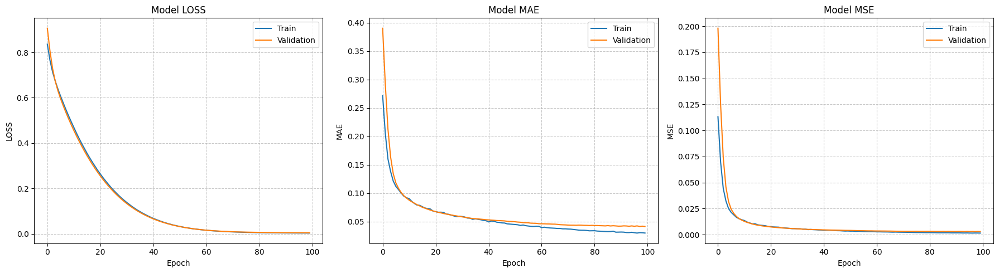


--- Final Test Set Evaluation (GW 22) ---
R²: 0.8367559809139965
MAE: 0.0454772822558880
MSE: 0.0035228736232966
Loss: 0.0051538040861487

--- Results for Gameweek 16 ---


,fpl_name,fpl_id,team,position,Actual_xP,Predicted_xP
3730,Foden,414.0,Man City,MID,11.9,10.016743
4087,B.Fernandes,449.0,Man Utd,MID,9.6,8.778526
131,Saka,16.0,Arsenal,MID,7.0,8.411537
448,Rogers,47.0,Aston Villa,MID,8.2,8.371191
5802,Ekitiké,661.0,Liverpool,FWD,6.3,8.301425
...,...,...,...,...,...,...
6216,Tchatchoua,695.0,Wolves,DEF,0.2,0.724057
1380,Mitoma,157.0,Brighton,MID,-0.3,0.668004
5399,L.Paquetá,612.0,West Ham,MID,0.8,0.662745
5448,G.Rodriguez,618.0,West Ham,MID,0.6,0.662718


In [12]:
history_16, evaluation_metrics_16, preds_df_16 = apnn_trainer(active_data_, cols, 16)
# Plot History
plot_training_history(history_16)

# EVALUATE TEST SET PERFORMANCE
print(f"\n--- Final Test Set Evaluation (GW {gw}) ---")
print(f"R²: {evaluation_metrics_16['test_R2']:.16f}")
print(f"MAE: {evaluation_metrics_16['test_mae']:.16f}")
print(f"MSE: {evaluation_metrics_16['test_mse']:.16f}")
print(f"Loss: {evaluation_metrics_16['test_loss']:.16f}")


print("\n--- Results for Gameweek 16 ---")
preds_df_16.sort_values(by='Predicted_xP', ascending=False)#.#head(10).round(2).to_string(index=False))



In [20]:
preds_df_16[preds_df_16['fpl_id'] == 430]

,fpl_name,fpl_id,team,position,Actual_xP,Predicted_xP


#### Plots


###### GK


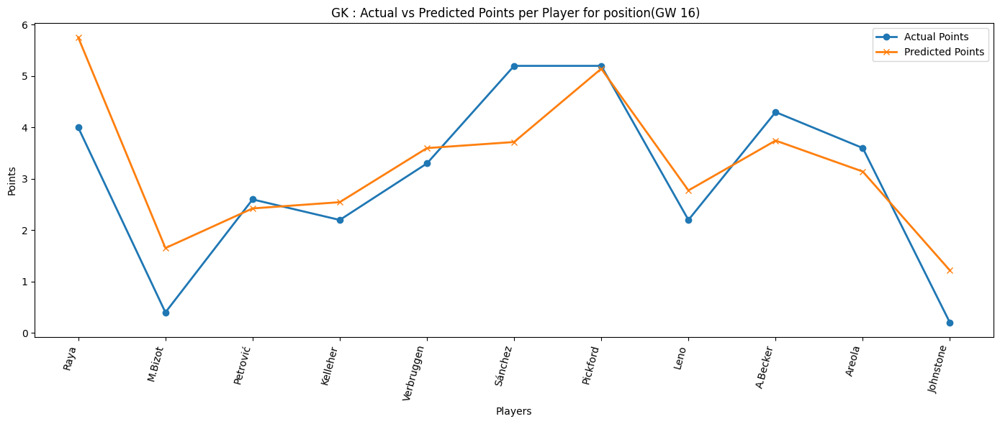

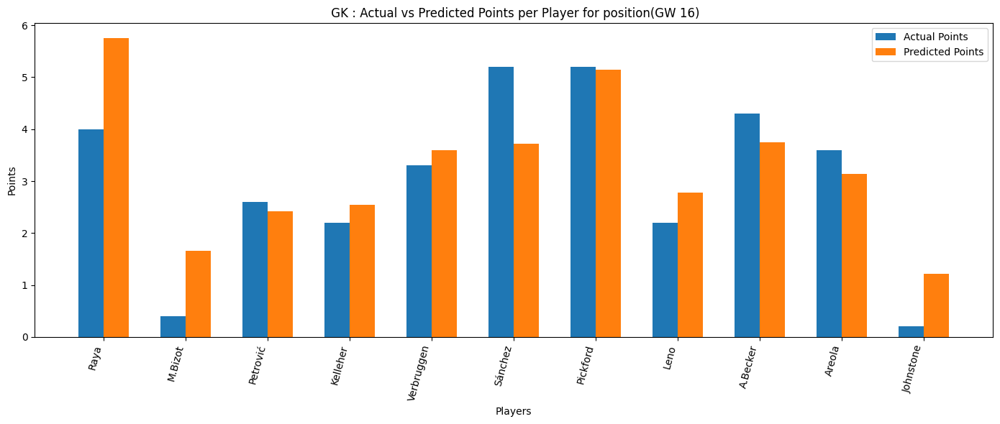

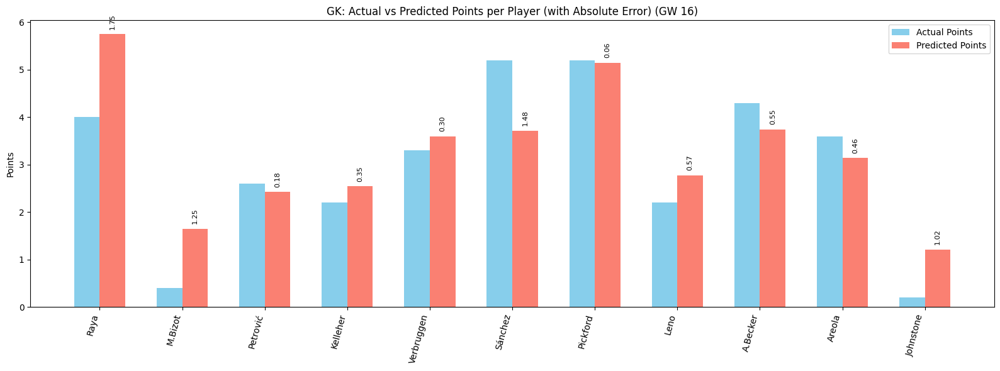

In [13]:
plot_preds(preds_df_16, 'GK', 16)


###### DEF


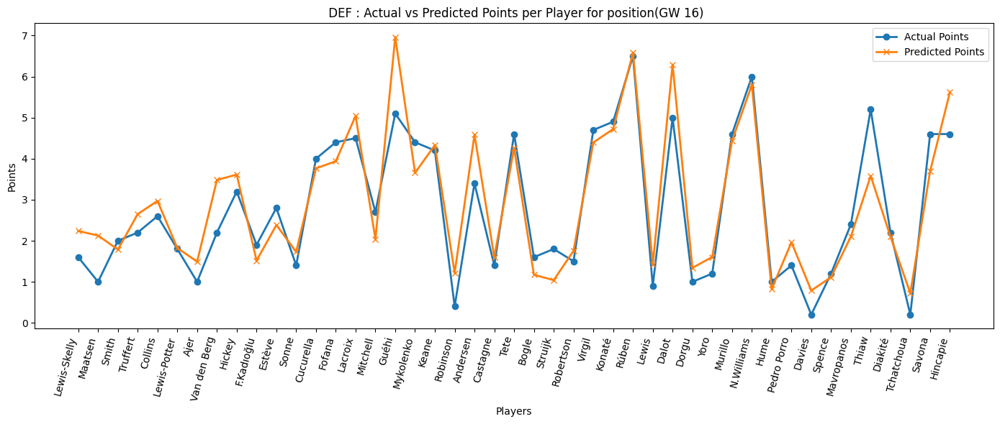

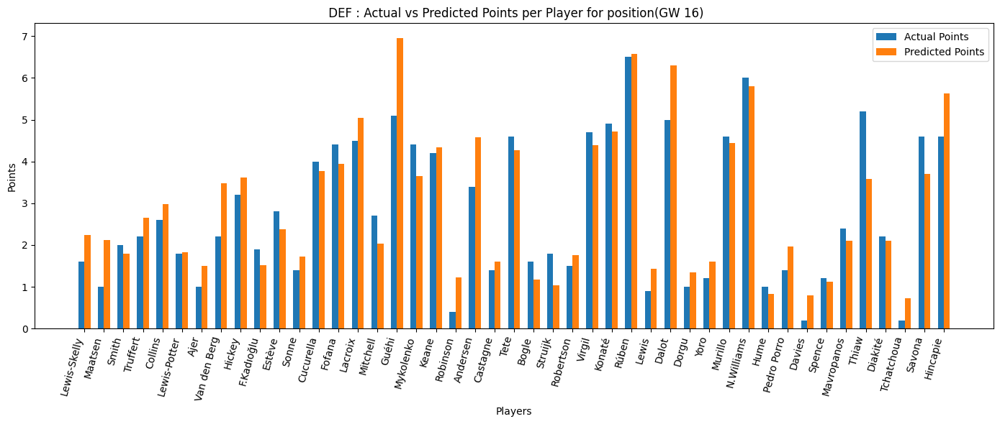

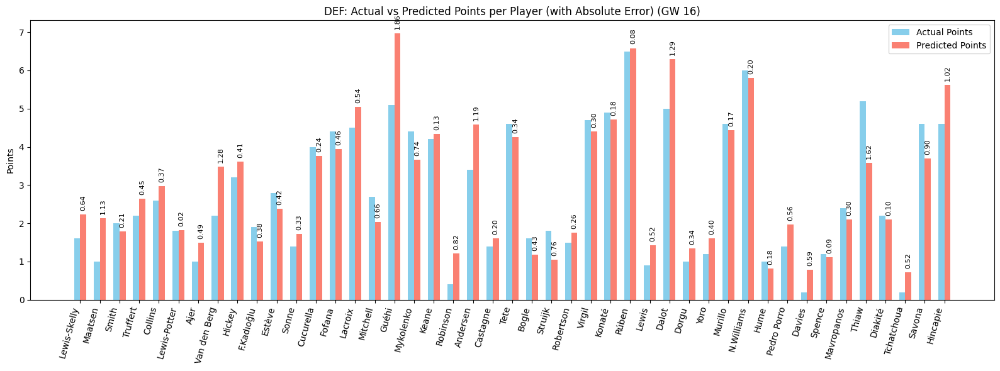

In [14]:
plot_preds(preds_df_16, 'DEF', 16)

###### MID


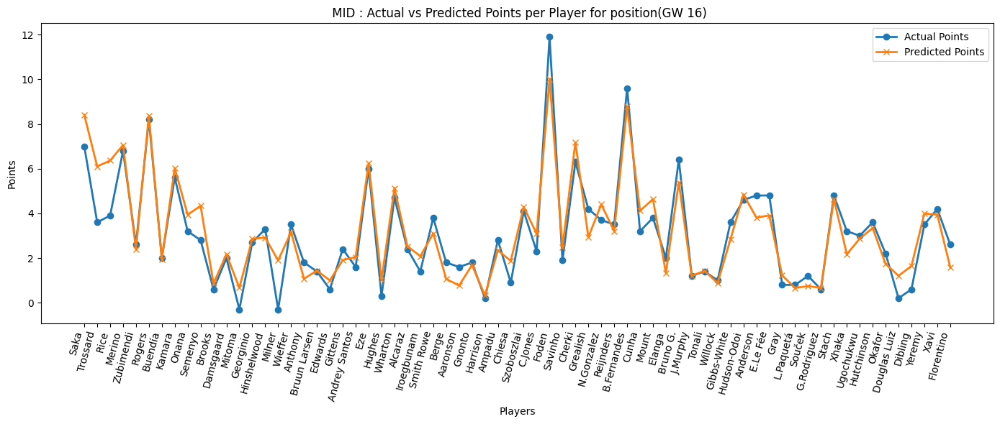

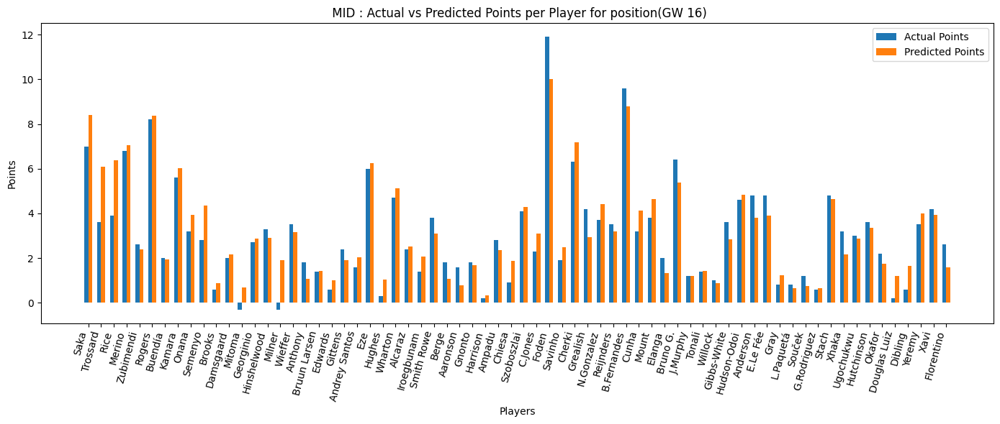

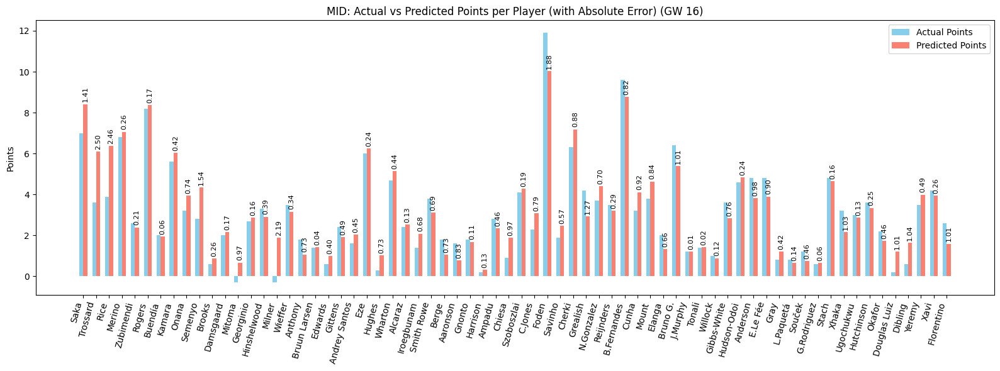

In [15]:
plot_preds(preds_df_16, 'MID', 16)

###### FWD


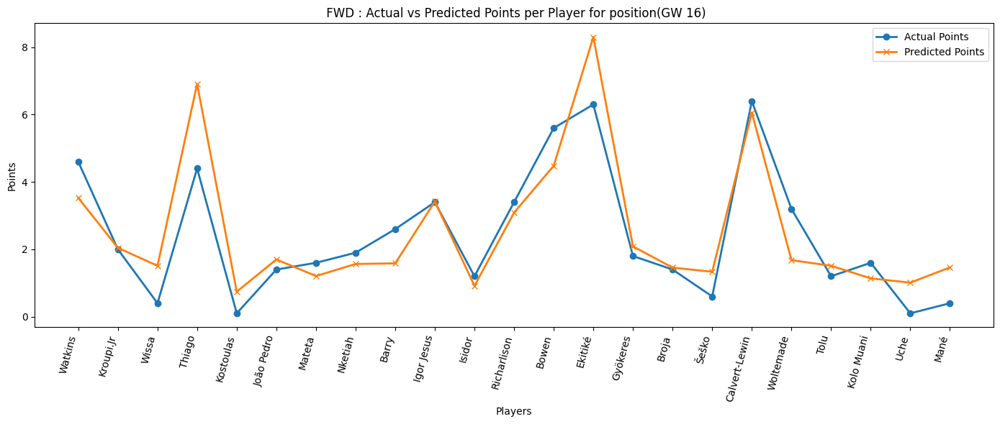

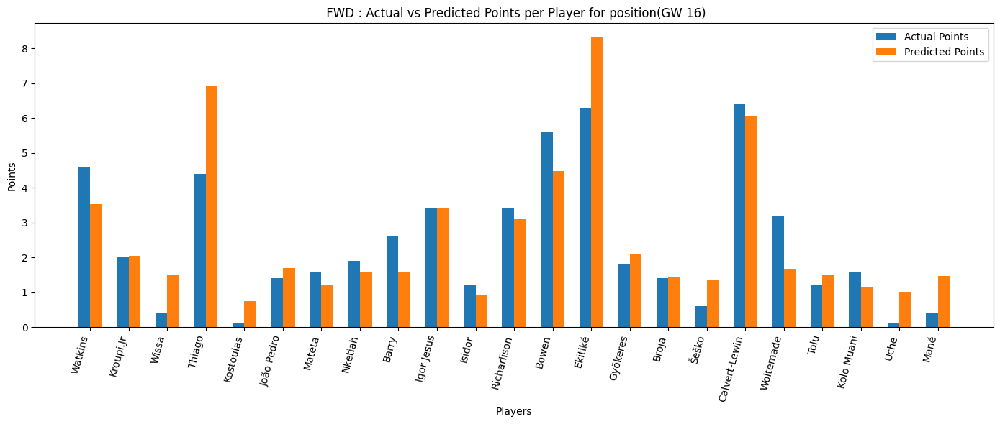

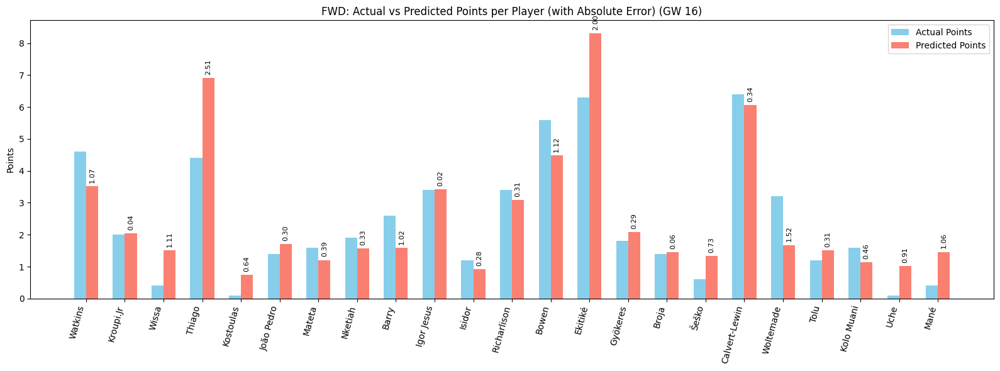

In [16]:
plot_preds(preds_df_16, 'FWD', 16)

### GW 17


Data prepared. X shape: (3840, 199), M shape: (3840, 4), Y shape: (3840, 2)

Starting Training...
Epoch 1/10


47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 19.5217 - mae: 3.7595 - mse: 19.2815 - val_loss: 9.3545 - val_mae: 2.4432 - val_mse: 9.1143
Epoch 2/10
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 8.8757 - mae: 2.2429 - mse: 8.6353 - val_loss: 4.6236 - val_mae: 1.5752 - val_mse: 4.3827
Epoch 3/10
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.0581 - mae: 1.6892 - mse: 4.8170 - val_loss: 3.5374 - val_mae: 1.4461 - val_mse: 3.2961
Epoch 4/10
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3.3972 - mae: 1.3780 - mse: 3.1559 - val_loss: 3.0677 - val_mae: 1.3485 - val_mse: 2.8264
Epoch 5/10
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2.8622 - mae: 1.2798 - mse: 2.6210 - val_loss: 2.6526 - val_mae: 1.2269 - val_mse: 2.4113
Epoch 6/10
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.2038 - mae: 1.1076 - mse: 1.9625 - val_loss: 2.3386 - val_mae: 1.1256 - val_mse: 2.0973
Epoch 7/10
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.7175 - mae: 0.9526 - mse: 1.4762 - val_loss: 2.0437 - val_ma

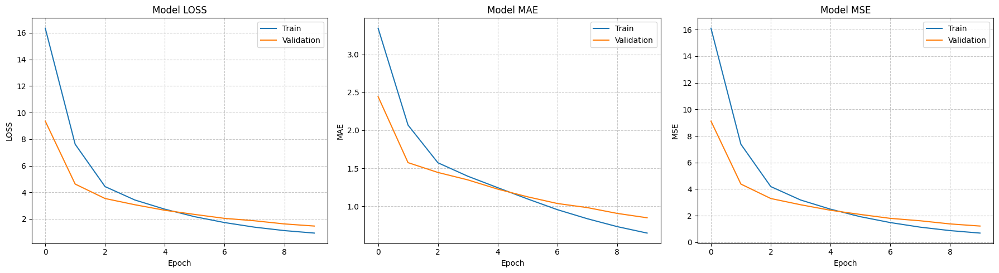


--- Final Test Set Evaluation (GW 17) ---

Evaluating test set performance...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Evaluating test set performance...{'loss': 1.3994171619415283, 'mae': 0.8321473002433777, 'mse': 1.158032774925232}
R²: 0.70902898929467417
MAE: 0.83214730024337769
MSE: 1.15803277492523193
Loss: 1.39941716194152832

Generating Predictions...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

--- Results for Gameweek 17 ---
 Gameweek        Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       17         Foden       12.1         11.77      -0.38     -0.71
       17        Rogers        8.2          8.64      -0.38     -0.71
       17          Rice        6.2          8.31      -0.38     -0.71
       17        Cherki        5.7          7.68      -0.38     -0.71
       17       Semenyo        4.8          7.51      -0.38     -0.71
       17 Calvert-Lewin        8.8          6.53       2.63     -0.71
       17      Bruno G.        4.8          5.84      -0.38     -0.71
       17

In [12]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 17)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_17 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_17.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_17 = model_17.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_17)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 17) ---")
test_result_17 = model_17.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_17, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_17}")
print(f"R²: {evaluation_metrics['test_R2']:.17f}")
print(f"MAE: {evaluation_metrics['test_mae']:.17f}")
print(f"MSE: {evaluation_metrics['test_mse']:.17f}")
print(f"Loss: {evaluation_metrics['test_loss']:.17f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_17 = model_17.predict([X_test_scaled, M_test_scaled]).flatten()


position_17 = active_data['position'][test_mask]
teams_17 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_17, 'team': teams_17, 'position': position_17}
preds_df_17 = pd.DataFrame(players_preds)

# Results
results_df_17 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_17,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 17 ---")
print(results_df_17.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


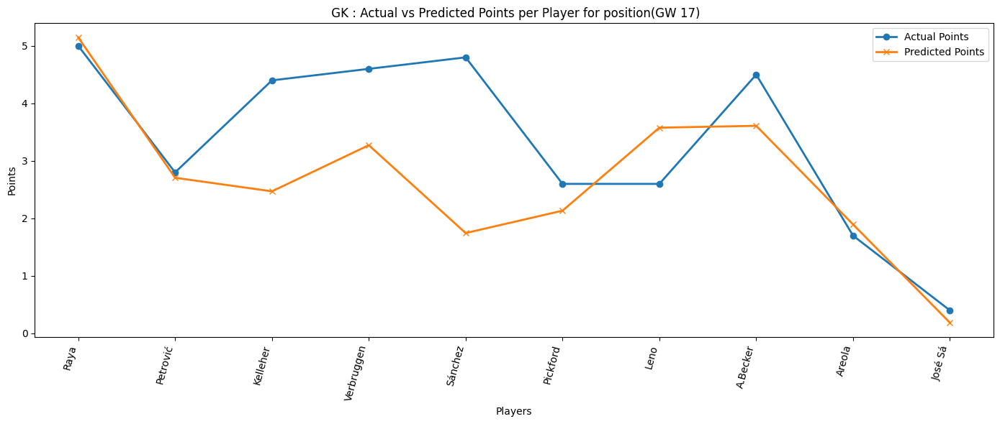

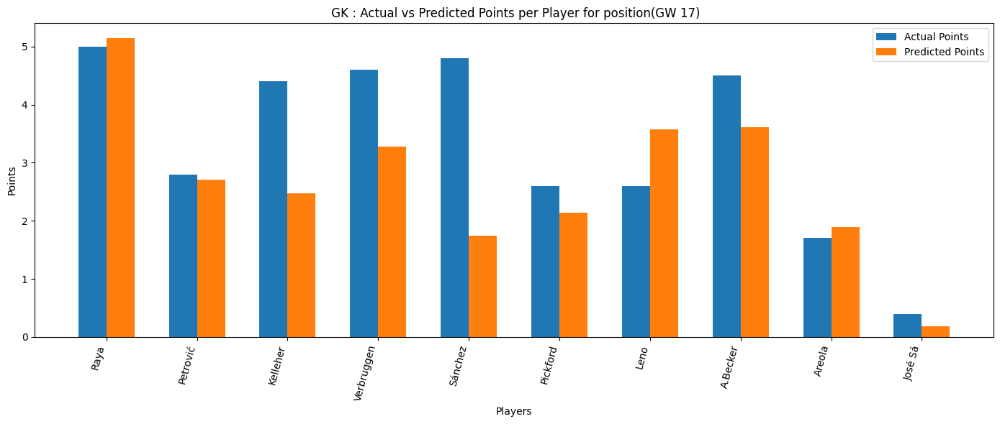

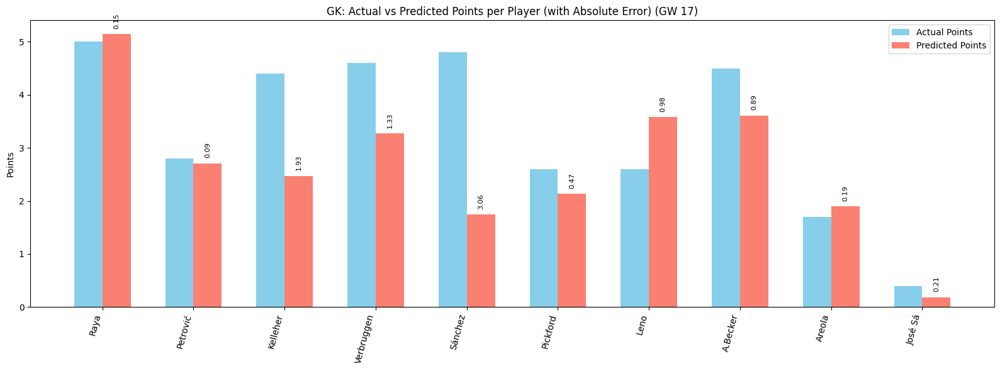

In [13]:
plot_preds(preds_df_17, 'GK', 17)


###### DEF


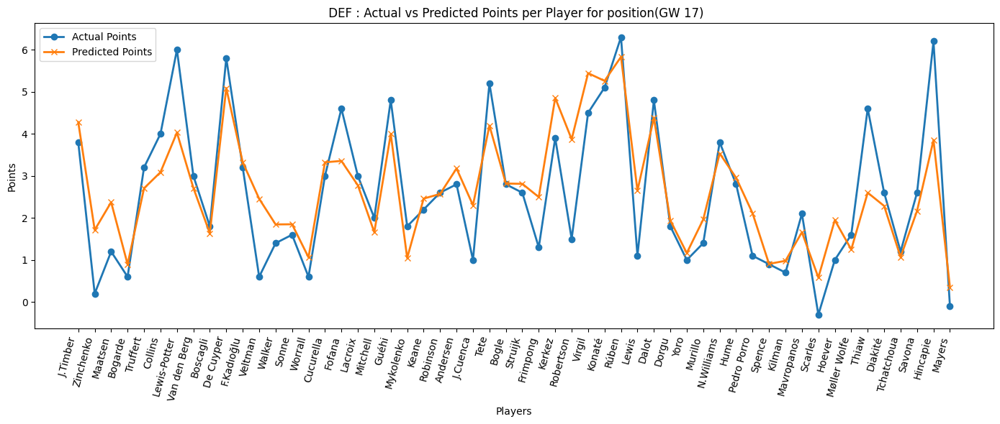

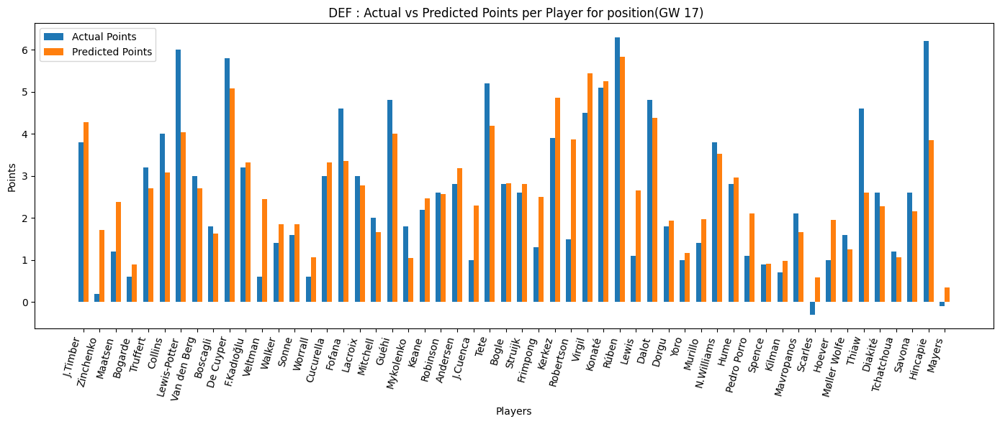

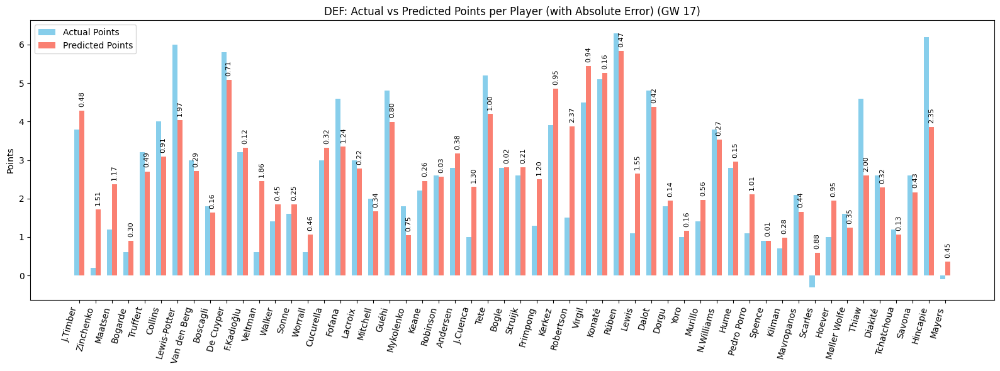

In [14]:
plot_preds(preds_df_17, 'DEF', 17)

###### MID


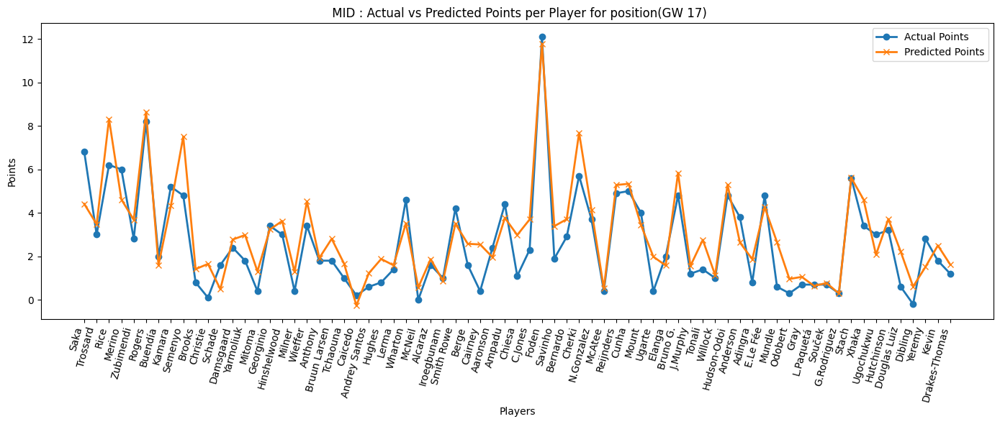

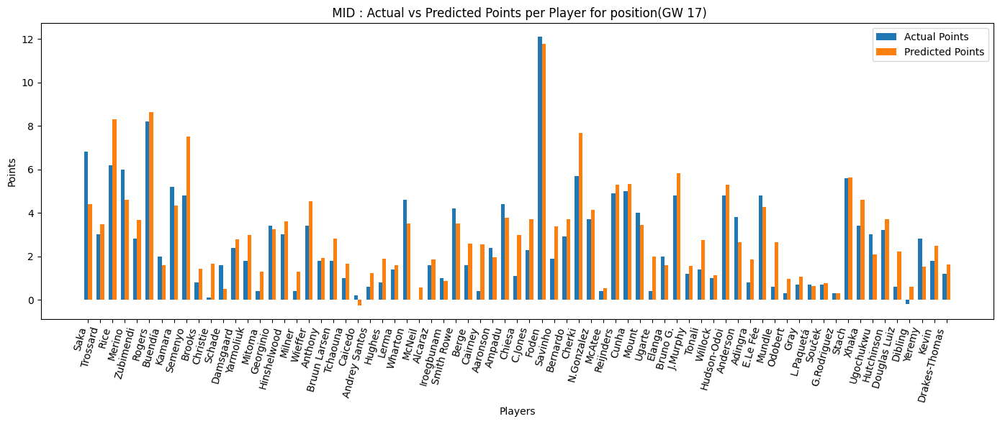

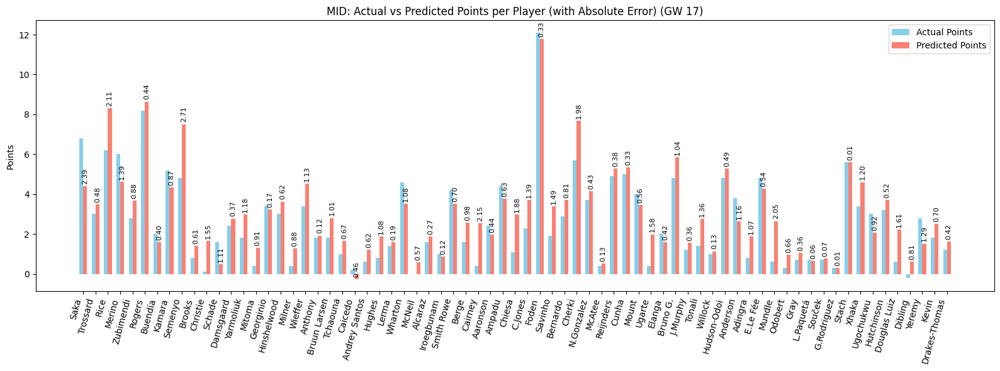

In [15]:
plot_preds(preds_df_17, 'MID', 17)

###### FWD


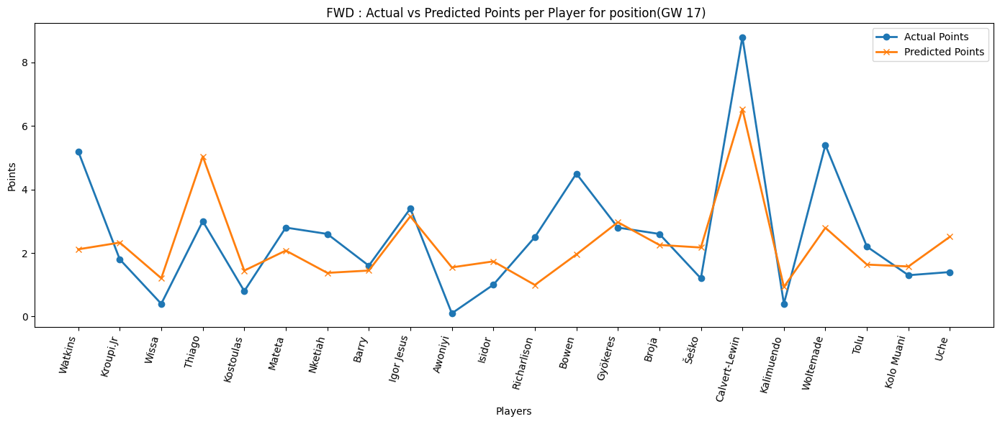

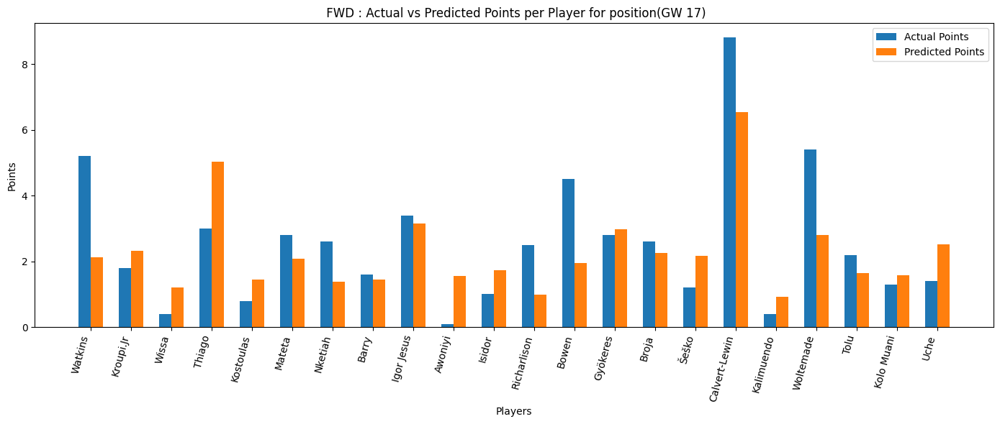

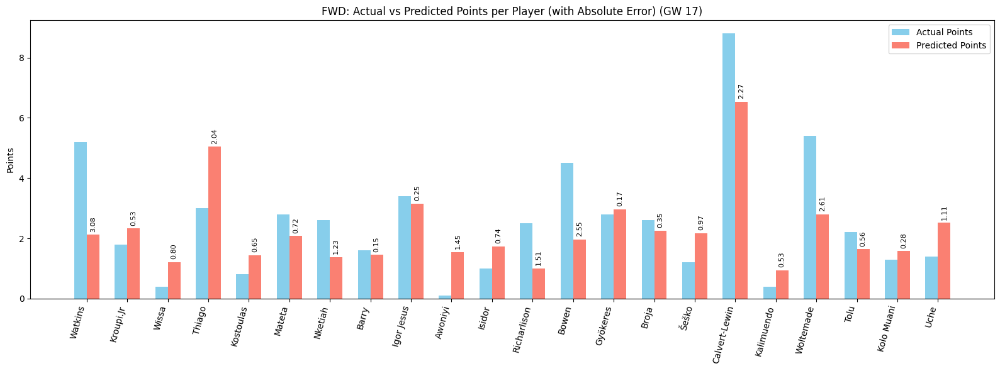

In [16]:
plot_preds(preds_df_17, 'FWD', 17)

### GW 18


Data prepared. X shape: (3840, 199), M shape: (3840, 4), Y shape: (3840, 2)

Starting Training...
Epoch 1/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 6.1497 - mae: 1.8282 - mse: 5.9081 - val_loss: 3.5760 - val_mae: 1.4453 - val_mse: 3.3342
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3652 - mae: 1.5528 - mse: 4.1233 - val_loss: 3.2196 - val_mae: 1.3923 - val_mse: 2.9779
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.3650 - mae: 1.3931 - mse: 3.1232 - val_loss: 2.8861 - val_mae: 1.3078 - val_mse: 2.6444
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.0316 - mae: 1.3290 - mse: 2.7899 - val_loss: 2.6001 - val_mae: 1.2217 - val_mse: 2.3585
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.4102 - mae: 1.1655 - mse: 2.1686 - val_loss: 2.3505 - val_mae: 1.1545 - val_mse: 2.1090
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.9533 - mae: 1.0397 - mse: 1.7117 - val_loss: 2.1688 - val_mae: 1.0916 - val_mse: 1.9273
Epoch 7/10
46

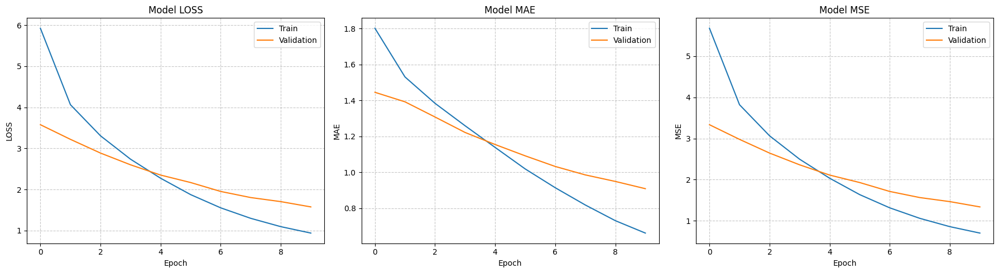


--- Final Test Set Evaluation (GW 18) ---

Evaluating test set performance...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Evaluating test set performance...{'loss': 1.321255087852478, 'mae': 0.781865119934082, 'mse': 1.0800015926361084}
R²: 0.690968615864261393
MAE: 0.781865119934082031
MSE: 1.080001592636108398
Loss: 1.321255087852478027

Generating Predictions...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

--- Results for Gameweek 18 ---
 Gameweek    Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       18    Cherki        7.5          7.54      -0.38     -0.71
       18   Ekitiké        7.5          7.35       2.61     -0.71
       18    Rogers        7.0          6.89      -0.38     -0.71
       18     Foden        9.5          6.84      -0.38     -0.71
       18      Rice        6.2          6.37      -0.38     -0.71
       18     Keane        4.8          6.36      -0.38      1.40
       18 Tarkowski        6.2          5.69      -0.38      1.40
       18  Bruno G.        4.4        

In [17]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 18)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_18 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_18.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_18 = model_18.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_18)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 18) ---")
test_result_18 = model_18.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_18, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_18}")
print(f"R²: {evaluation_metrics['test_R2']:.18f}")
print(f"MAE: {evaluation_metrics['test_mae']:.18f}")
print(f"MSE: {evaluation_metrics['test_mse']:.18f}")
print(f"Loss: {evaluation_metrics['test_loss']:.18f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_18 = model_18.predict([X_test_scaled, M_test_scaled]).flatten()


position_18 = active_data['position'][test_mask]
teams_18 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_18, 'team': teams_18, 'position': position_18}
preds_df_18 = pd.DataFrame(players_preds)

# Results
results_df_18 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_18,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 18 ---")
print(results_df_18.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



In [44]:
test_result_18

{'loss': 1.321255087852478,
 'mae': 0.781865119934082,
 'mse': 1.0800015926361084}

#### Plots


###### GK


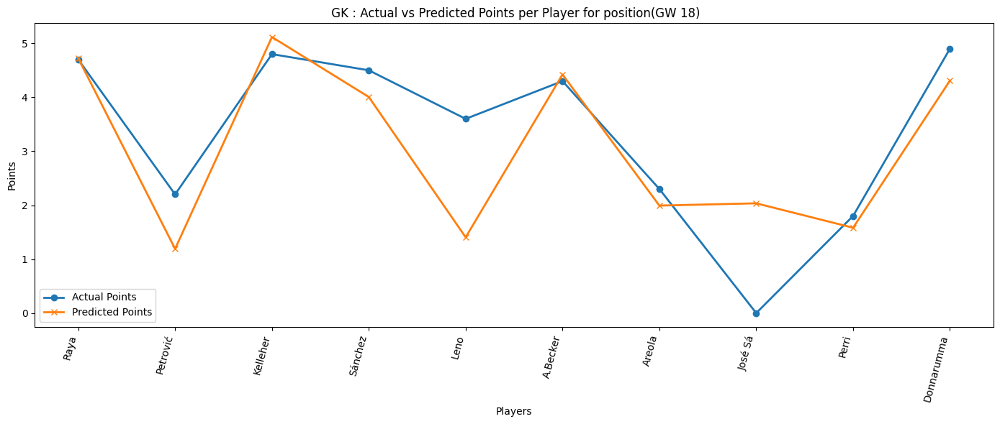

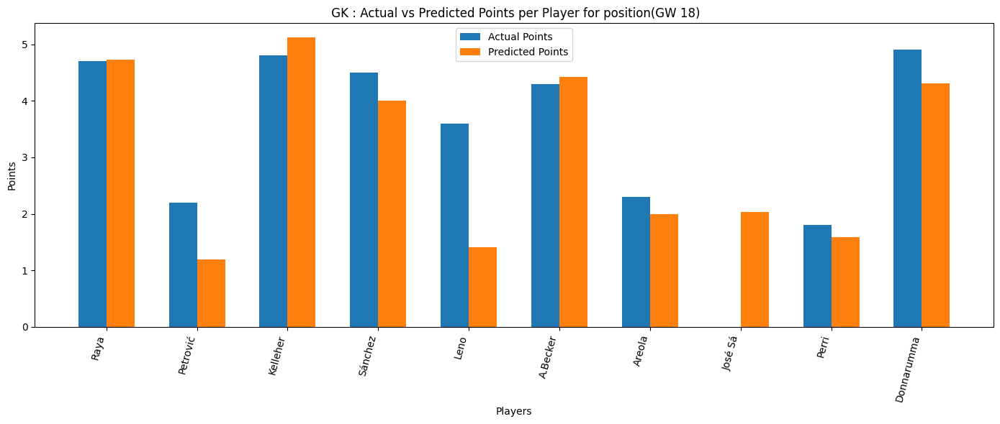

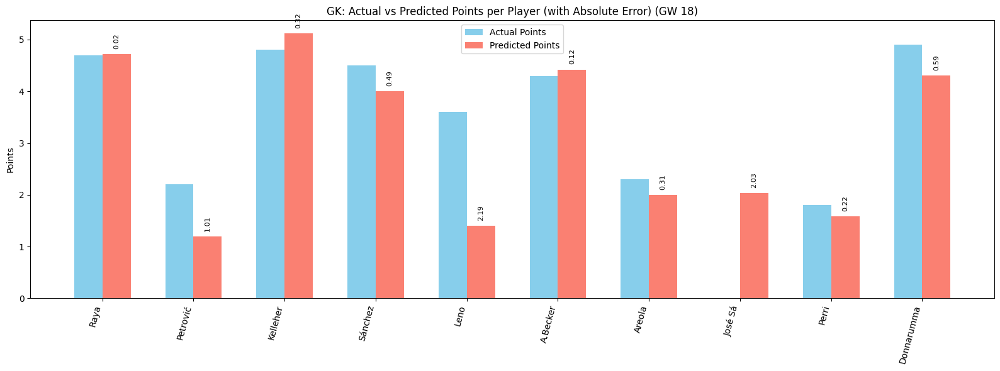

In [18]:
plot_preds(preds_df_18, 'GK', 18)


###### DEF


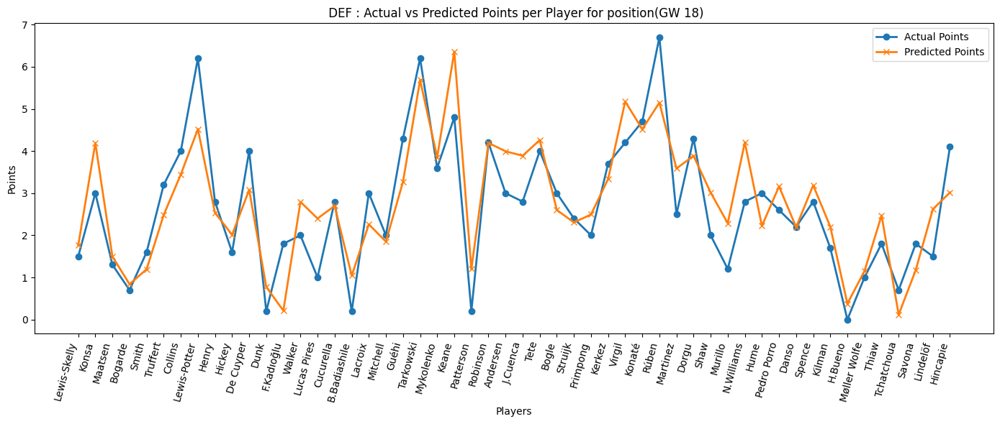

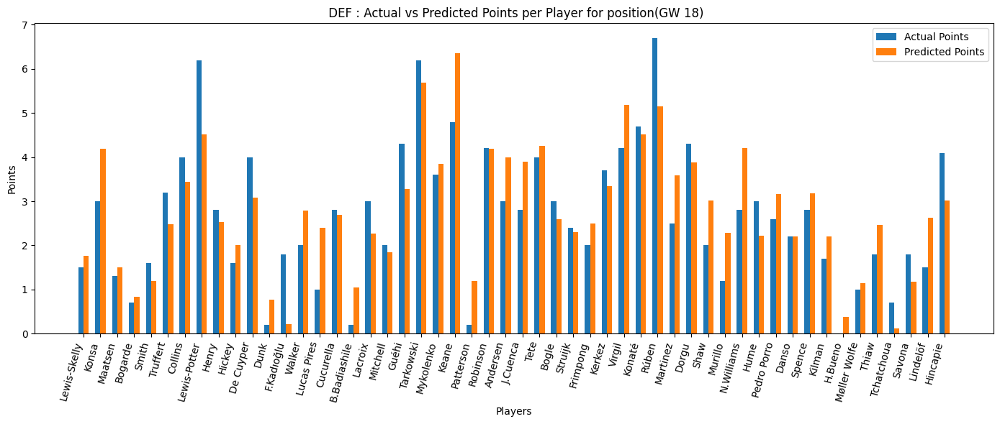

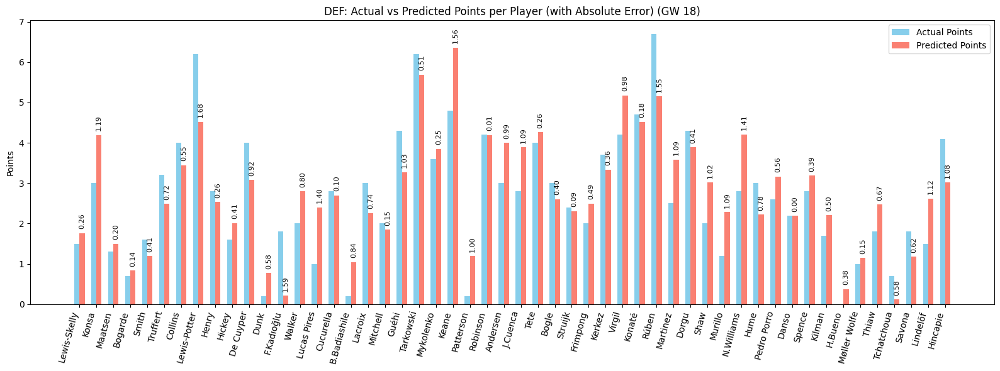

In [19]:
plot_preds(preds_df_18, 'DEF', 18)

###### MID


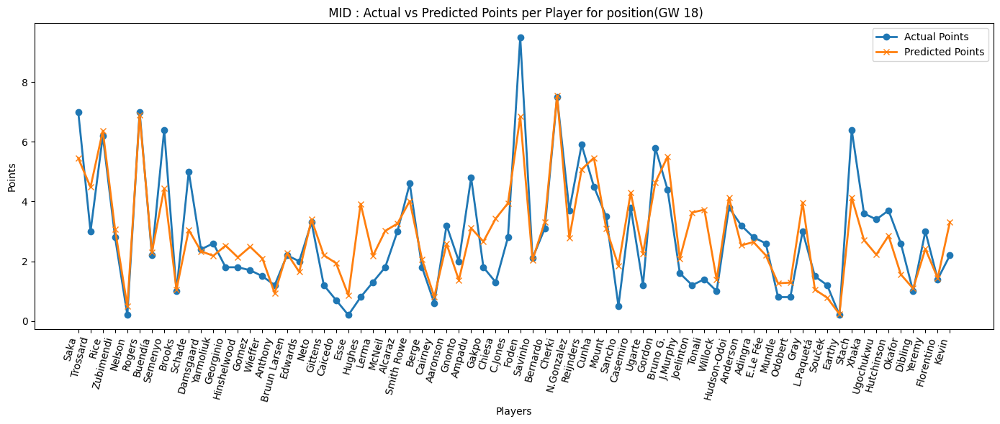

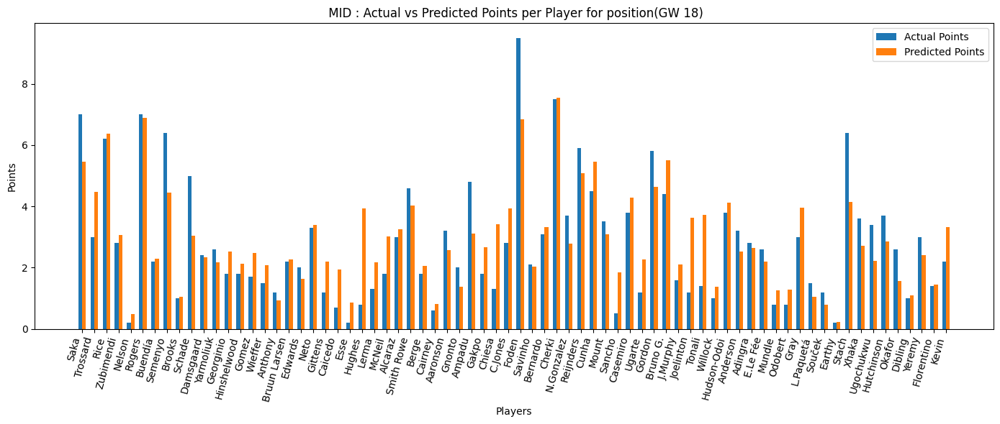

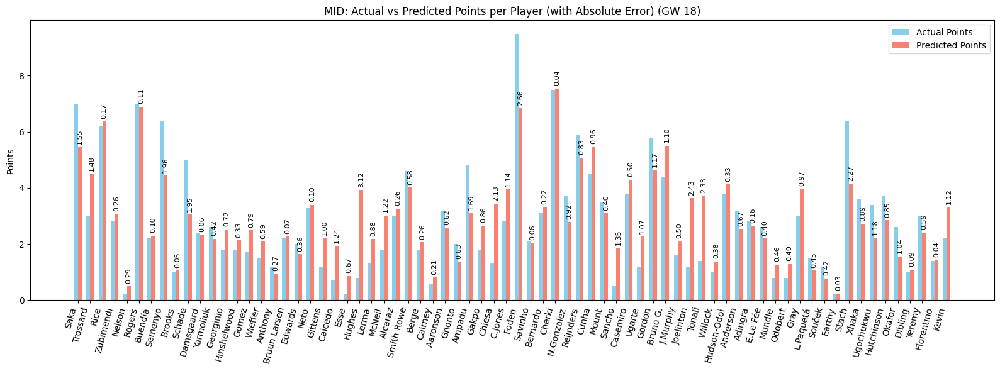

In [20]:
plot_preds(preds_df_18, 'MID', 18)

###### FWD


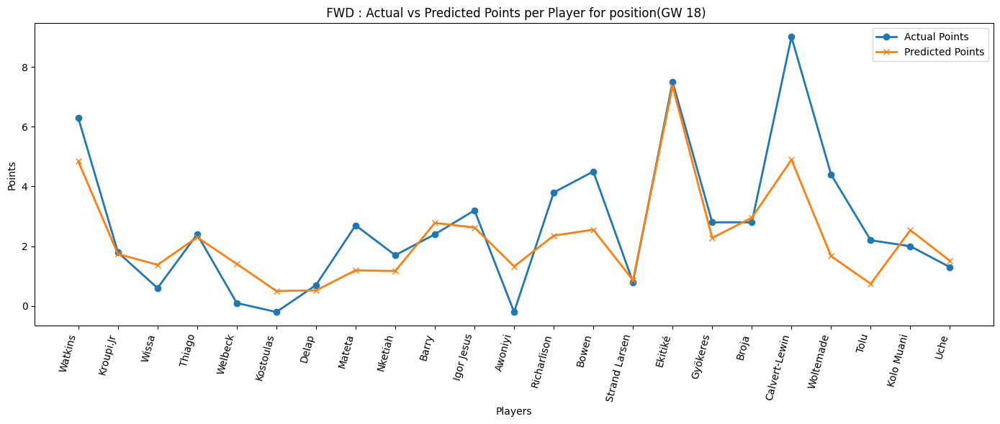

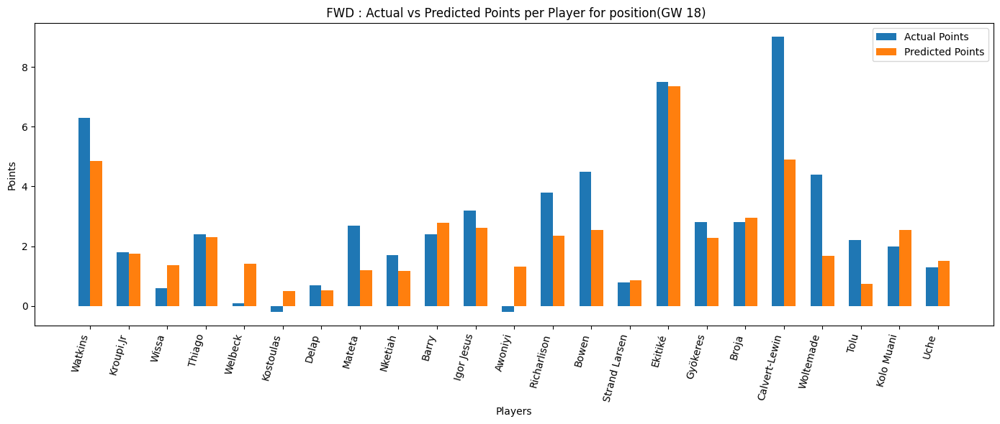

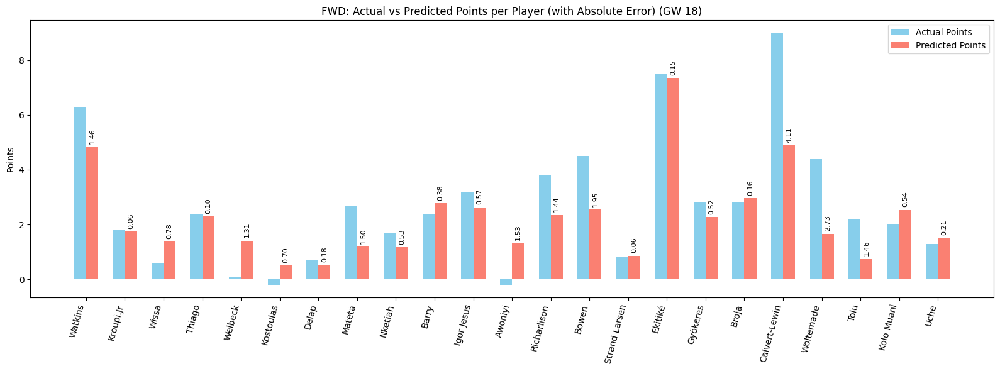

In [21]:
plot_preds(preds_df_18, 'FWD', 18)

### GW 19


Data prepared. X shape: (3840, 199), M shape: (3840, 4), Y shape: (3840, 2)

Starting Training...
Epoch 1/10


46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 5.9995 - mae: 1.7399 - mse: 5.7570 - val_loss: 3.5601 - val_mae: 1.4313 - val_mse: 3.3175
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4.2614 - mae: 1.5450 - mse: 4.0188 - val_loss: 3.0936 - val_mae: 1.3399 - val_mse: 2.8511
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4308 - mae: 1.4105 - mse: 3.1883 - val_loss: 2.7179 - val_mae: 1.2463 - val_mse: 2.4755
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.8126 - mae: 1.2586 - mse: 2.5702 - val_loss: 2.3655 - val_mae: 1.1522 - val_mse: 2.1231
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.1590 - mae: 1.0807 - mse: 1.9166 - val_loss: 2.1016 - val_mae: 1.0654 - val_mse: 1.8593
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.7183 - mae: 0.9550 - mse: 1.4759 - val_loss: 1.8486 - val_mae: 0.9891 - val_mse: 1.6063
Epoch 7/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.3809 - mae: 0.8414 - mse: 1.1386 - val_loss: 1.6143 - val_mae:

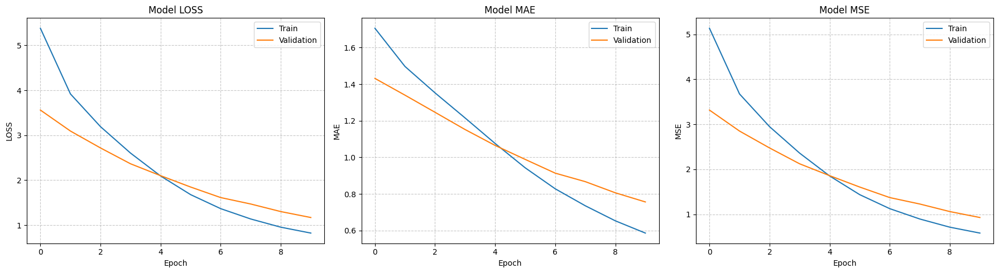


--- Final Test Set Evaluation (GW 19) ---

Evaluating test set performance...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Evaluating test set performance...{'loss': 1.1918721199035645, 'mae': 0.7602269053459167, 'mse': 0.9498212933540344}
R²: 0.7521735594993137486
MAE: 0.7602269053459167480
MSE: 0.9498212933540344238
Loss: 1.1918721199035644531

Generating Predictions...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

--- Results for Gameweek 19 ---
 Gameweek        Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       19        Cherki        8.5          8.05      -0.39     -0.71
       19        Rogers        5.8          7.52      -0.39     -0.71
       19       Ekitiké        8.9          6.87       2.58     -0.71
       19         Foden        6.7          6.43      -0.39     -0.71
       19  Lewis-Potter        7.2          6.31      -0.39      1.41
       19      Trossard        6.0          6.31      -0.39     -0.71
       19         Rúben        7.9          6.06      -0.39      1.41


In [22]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 19)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_19 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_19.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_19 = model_19.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_19)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 19) ---")
test_result_19 = model_19.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_19, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_19}")
print(f"R²: {evaluation_metrics['test_R2']:.19f}")
print(f"MAE: {evaluation_metrics['test_mae']:.19f}")
print(f"MSE: {evaluation_metrics['test_mse']:.19f}")
print(f"Loss: {evaluation_metrics['test_loss']:.19f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_19 = model_19.predict([X_test_scaled, M_test_scaled]).flatten()


position_19 = active_data['position'][test_mask]
teams_19 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_19, 'team': teams_19, 'position': position_19}
preds_df_19 = pd.DataFrame(players_preds)

# Results
results_df_19 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_19,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 19 ---")
print(results_df_19.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


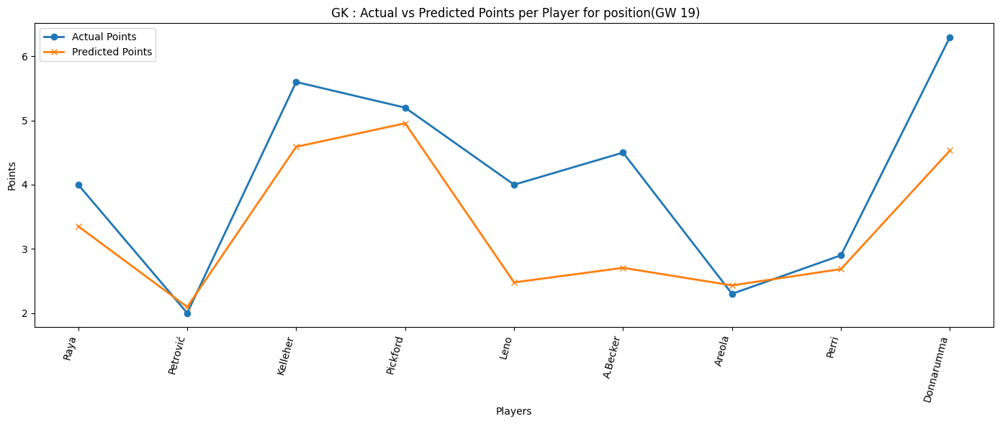

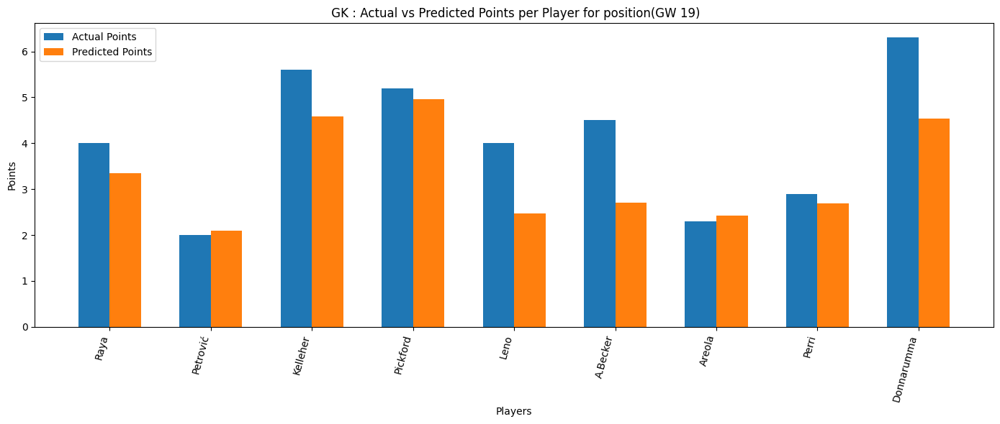

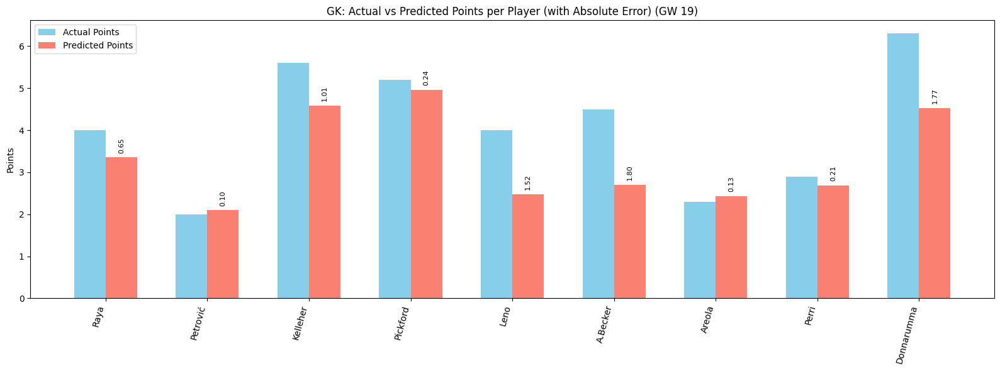

In [23]:
plot_preds(preds_df_19, 'GK', 19)


###### DEF


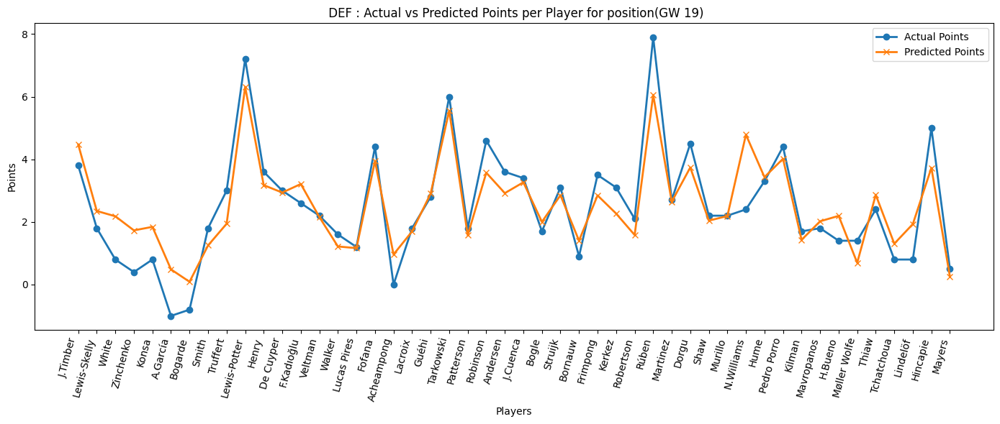

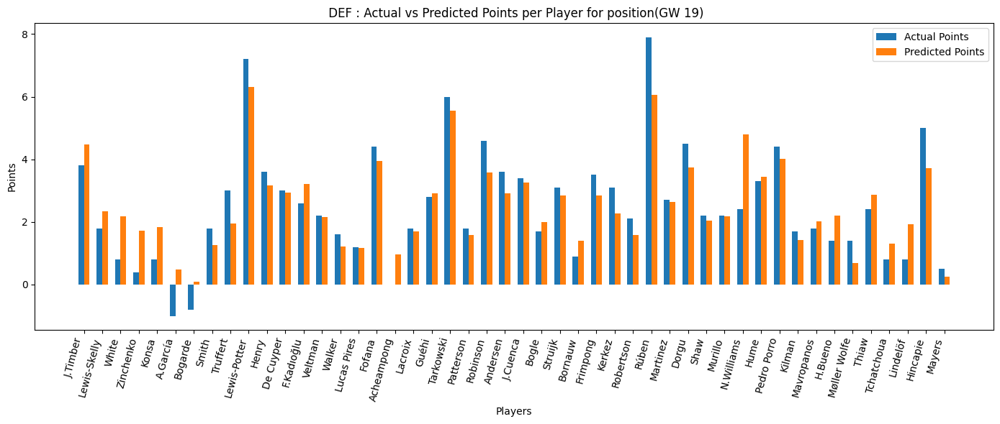

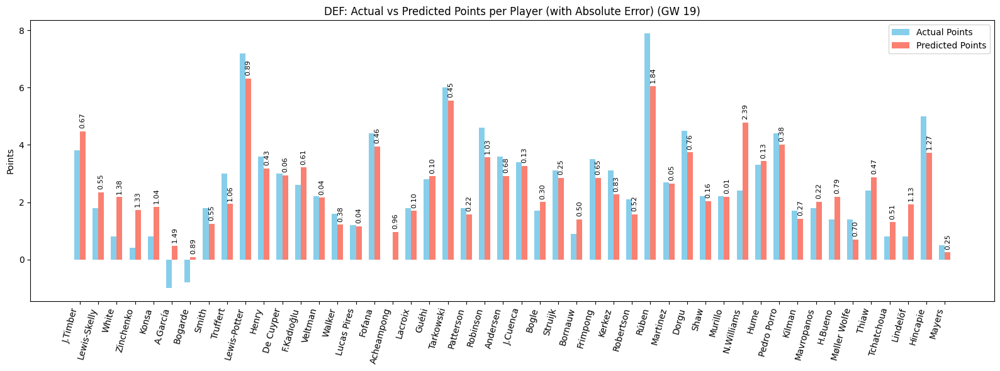

In [24]:
plot_preds(preds_df_19, 'DEF', 19)

###### MID


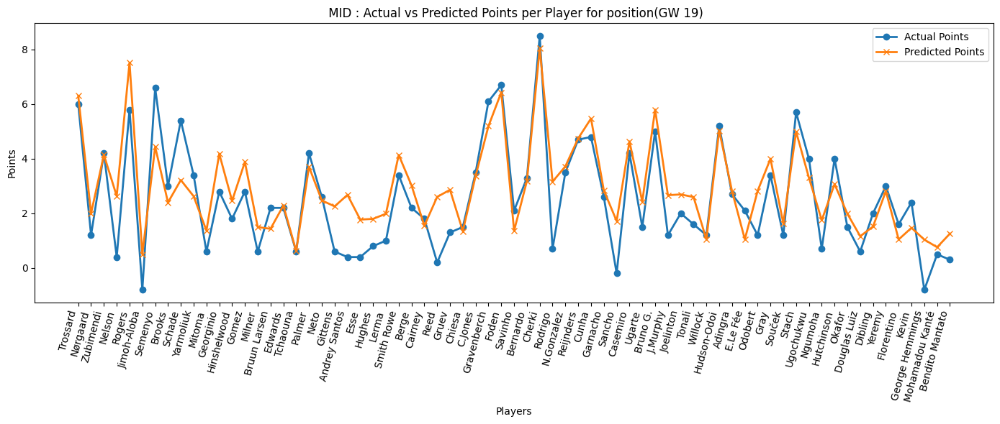

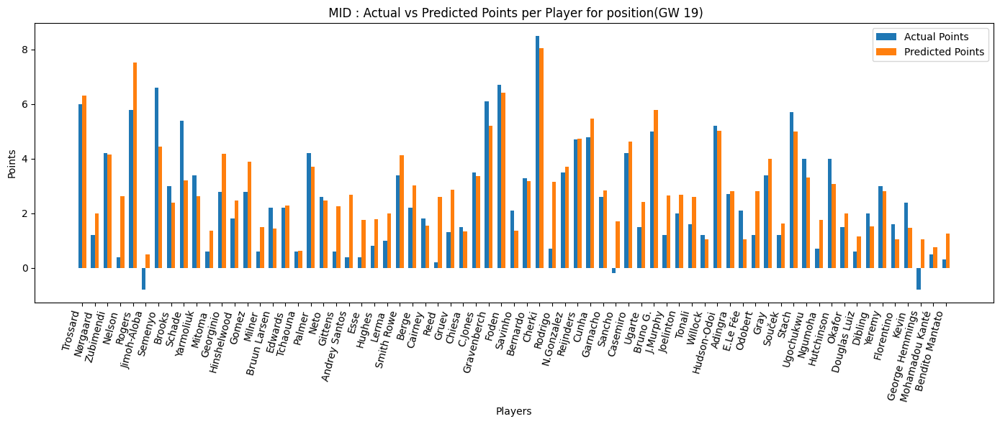

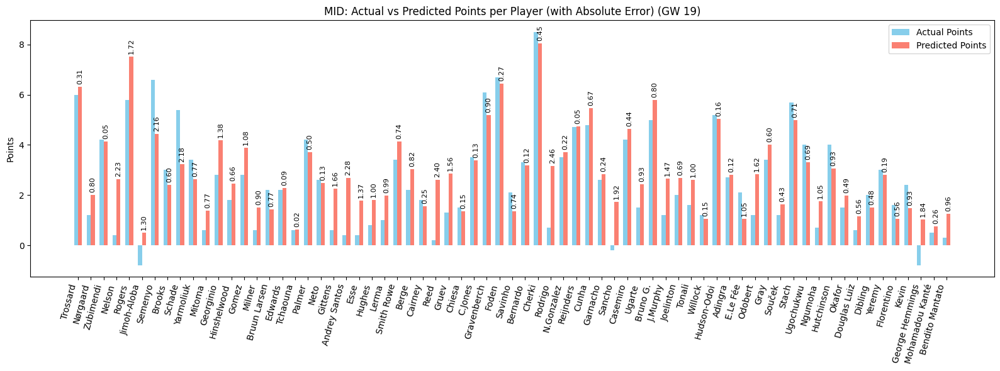

In [25]:
plot_preds(preds_df_19, 'MID', 19)

###### FWD


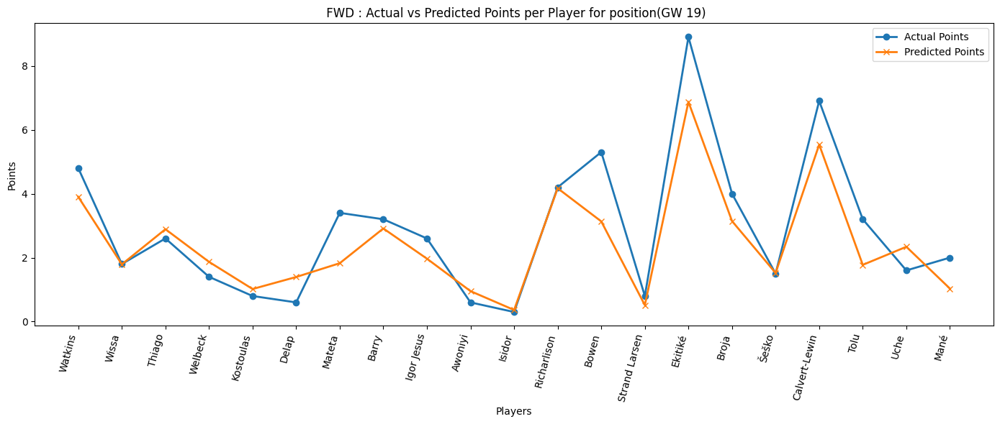

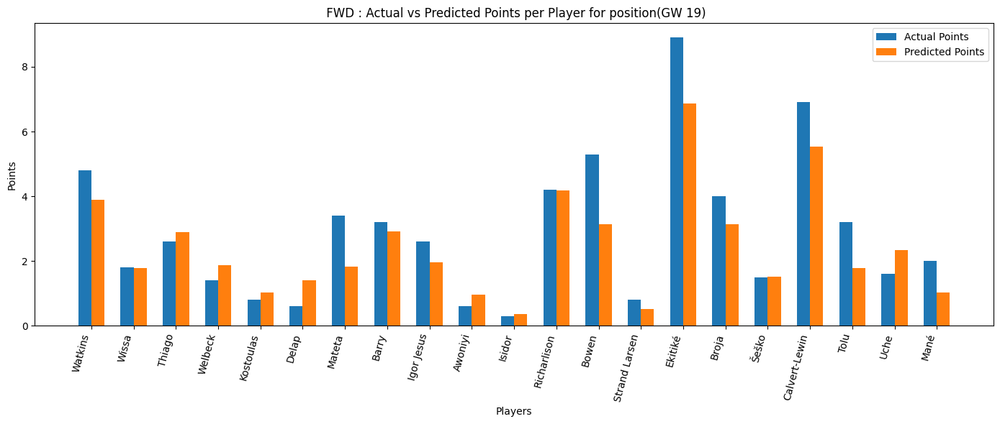

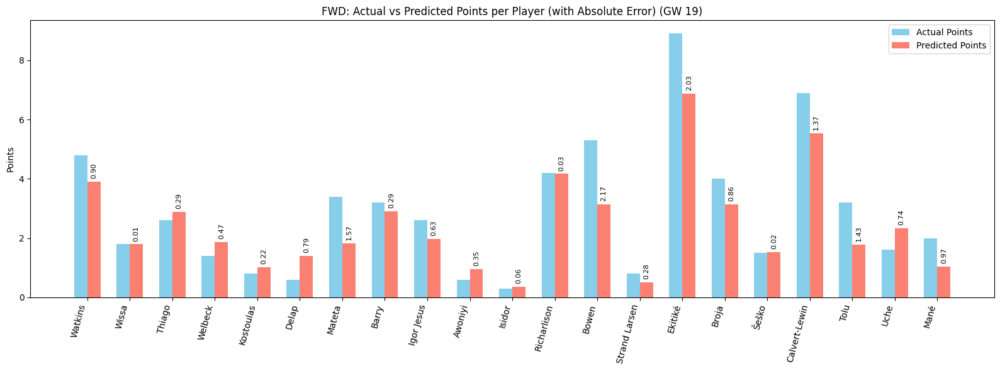

In [26]:
plot_preds(preds_df_19, 'FWD', 19)

### GW 20


Data prepared. X shape: (3840, 199), M shape: (3840, 4), Y shape: (3840, 2)

Starting Training...
Epoch 1/10


45/45 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 9.5203 - mae: 2.3872 - mse: 9.2794 - val_loss: 3.8346 - val_mae: 1.4330 - val_mse: 3.5935
Epoch 2/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5324 - mae: 1.5989 - mse: 4.2912 - val_loss: 3.0133 - val_mae: 1.3239 - val_mse: 2.7720
Epoch 3/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.1790 - mae: 1.3603 - mse: 2.9378 - val_loss: 2.6604 - val_mae: 1.2358 - val_mse: 2.4192
Epoch 4/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3710 - mae: 1.1604 - mse: 2.1299 - val_loss: 2.3501 - val_mae: 1.1448 - val_mse: 2.1090
Epoch 5/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.8917 - mae: 1.0220 - mse: 1.6506 - val_loss: 2.1045 - val_mae: 1.0601 - val_mse: 1.8635
Epoch 6/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.5274 - mae: 0.9016 - mse: 1.2864 - val_loss: 1.8817 - val_mae: 0.9890 - val_mse: 1.6407
Epoch 7/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.3249 - mae: 0.8127 - mse: 1.0839 - val_loss: 1.6794 - val_mae:

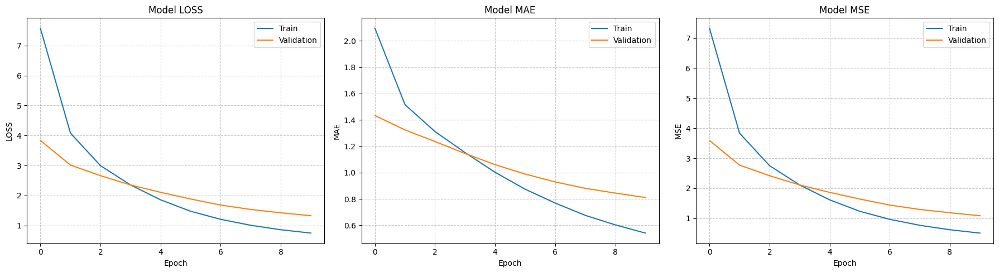


--- Final Test Set Evaluation (GW 20) ---

Evaluating test set performance...
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step
Evaluating test set performance...{'loss': 1.3855230808258057, 'mae': 0.8109793663024902, 'mse': 1.14524245262146}
R²: 0.62290605390564368626
MAE: 0.81097936630249023438
MSE: 1.14524245262145996094
Loss: 1.38552308082580566406

Generating Predictions...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

--- Results for Gameweek 20 ---
 Gameweek       Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       20         Rice        4.0          9.57      -0.39     -0.71
       20       Rogers        7.4          8.14      -0.39     -0.71
       20     Bruno G.        5.0          6.74      -0.39     -0.71
       20       Thiago        5.6          6.06       2.54     -0.71
       20     Trossard        5.0          5.71      -0.39     -0.71
       20       Schade        6.4          5.64      -0.39     -0.71
       20     Ødegaard        6.2          5.63      -0.39     -0.71
      

In [27]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 20)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_20 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_20.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_20 = model_20.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_20)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 20) ---")
test_result_20 = model_20.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_20, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_20}")
print(f"R²: {evaluation_metrics['test_R2']:.20f}")
print(f"MAE: {evaluation_metrics['test_mae']:.20f}")
print(f"MSE: {evaluation_metrics['test_mse']:.20f}")
print(f"Loss: {evaluation_metrics['test_loss']:.20f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_20 = model_20.predict([X_test_scaled, M_test_scaled]).flatten()


position_20 = active_data['position'][test_mask]
teams_20 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_20, 'team': teams_20, 'position': position_20}
preds_df_20 = pd.DataFrame(players_preds)

# Results
results_df_20 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_20,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 20 ---")
print(results_df_20.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


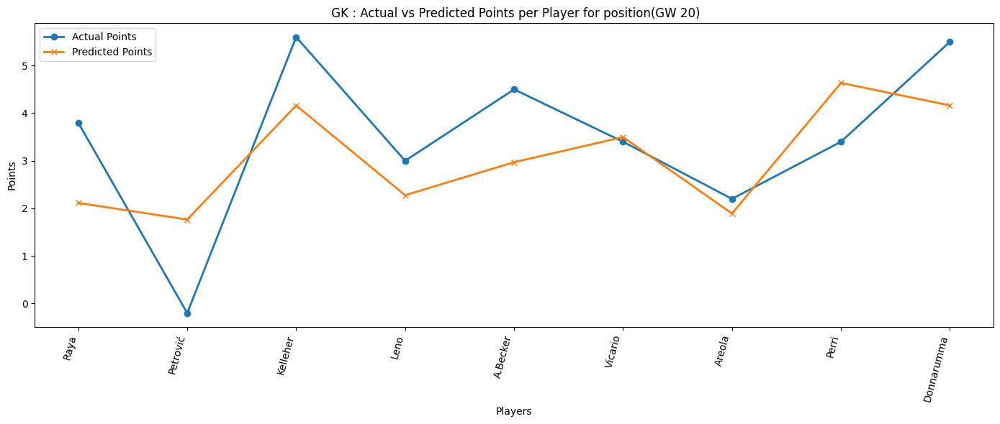

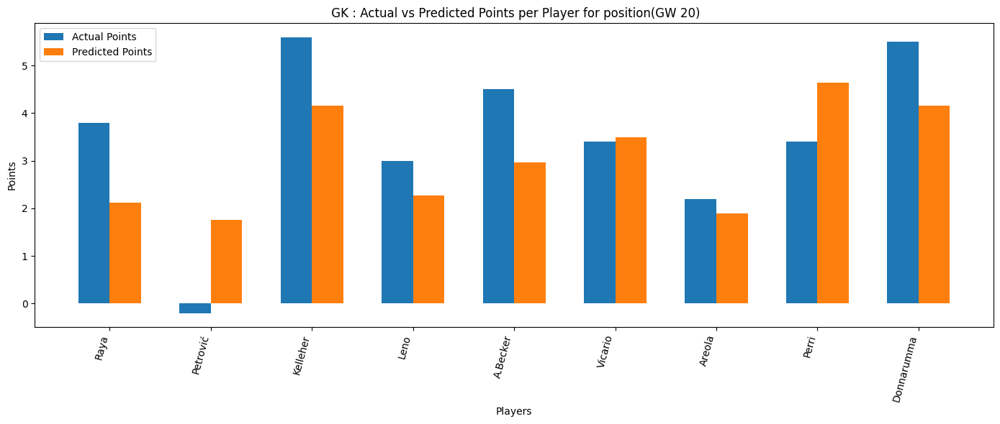

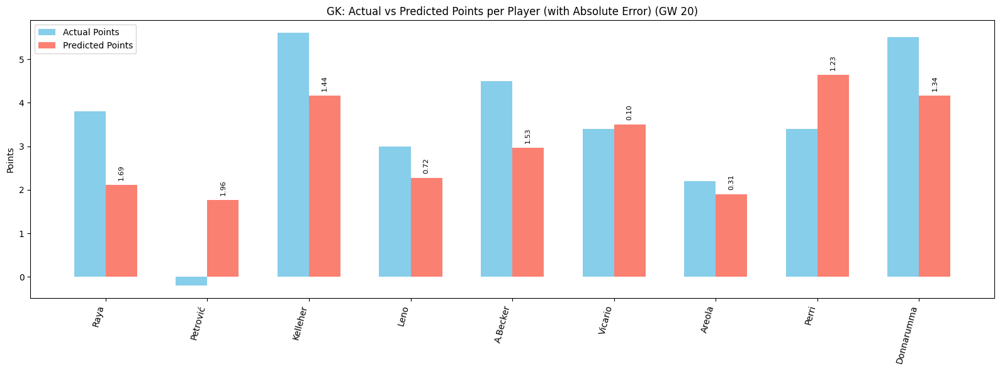

In [28]:
plot_preds(preds_df_20, 'GK', 20)


###### DEF


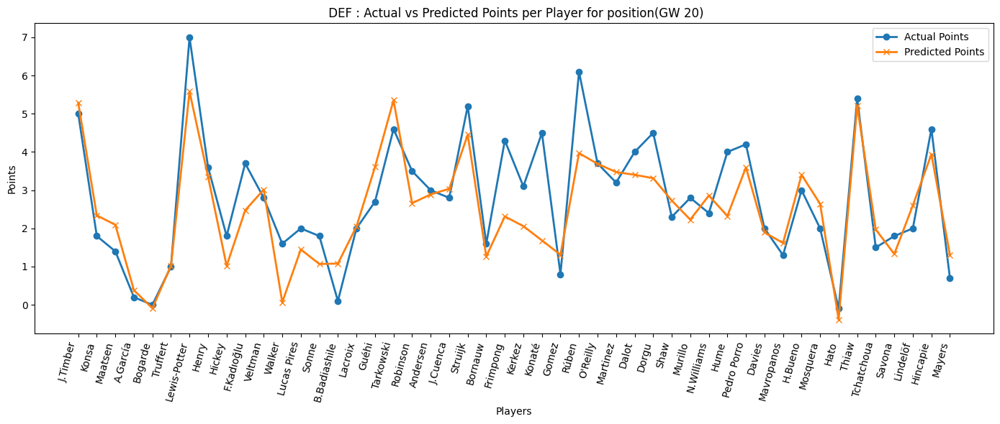

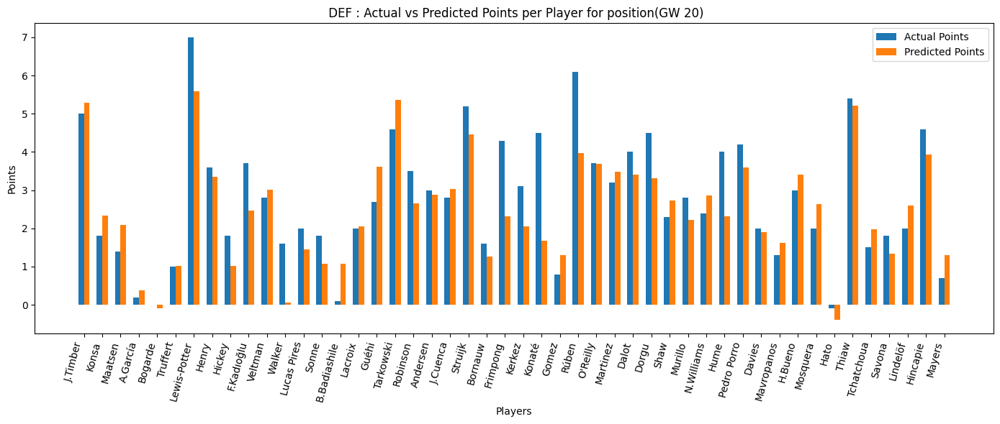

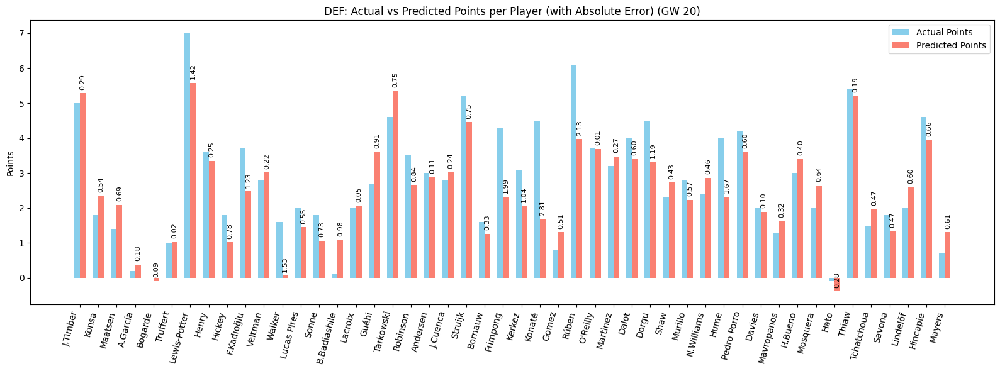

In [29]:
plot_preds(preds_df_20, 'DEF', 20)

###### MID


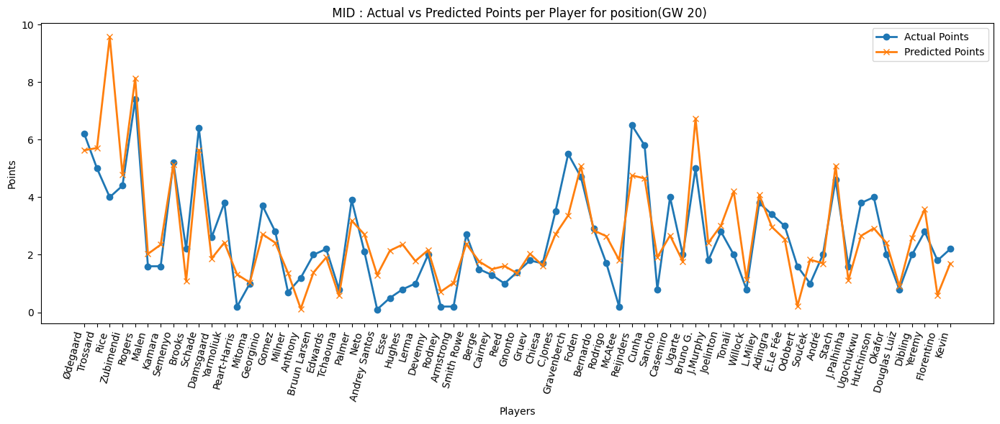

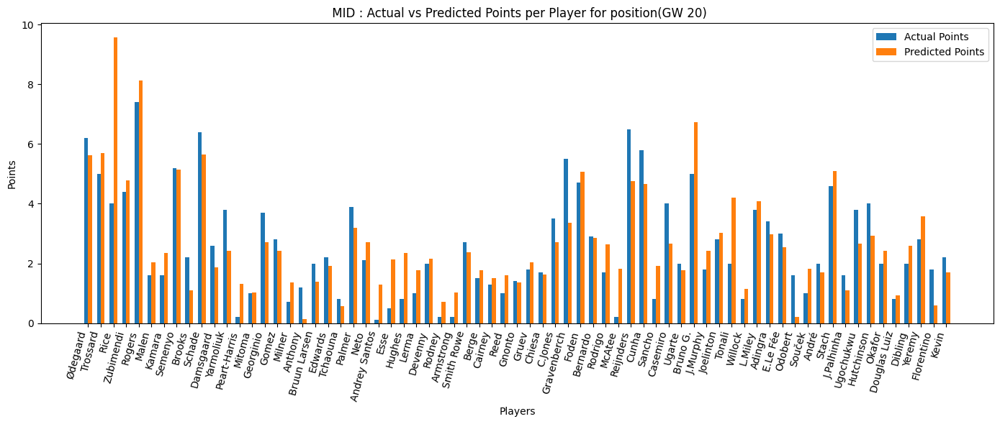

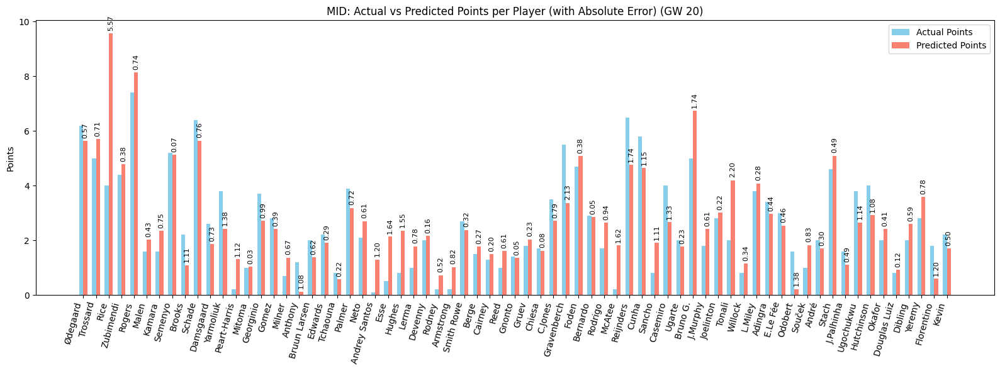

In [30]:
plot_preds(preds_df_20, 'MID', 20)

###### FWD


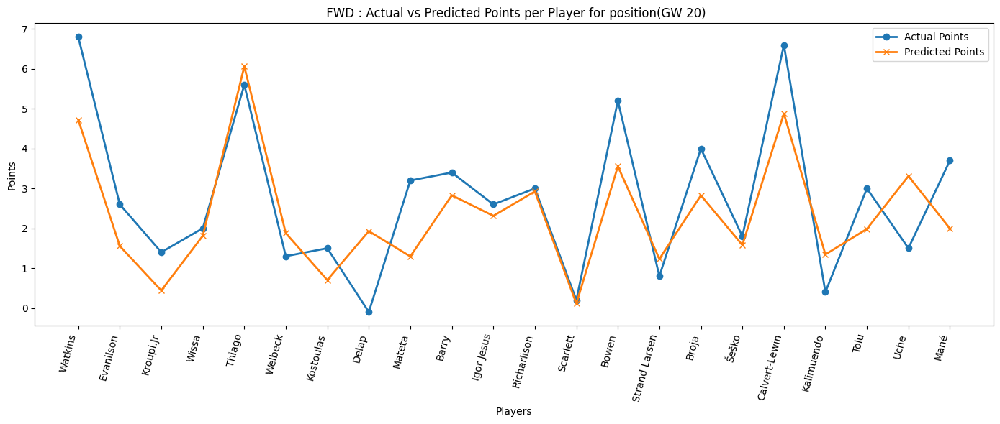

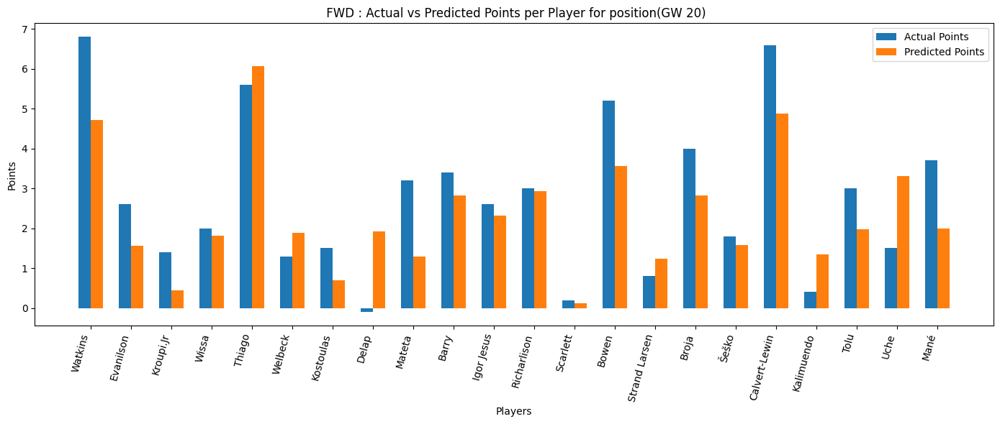

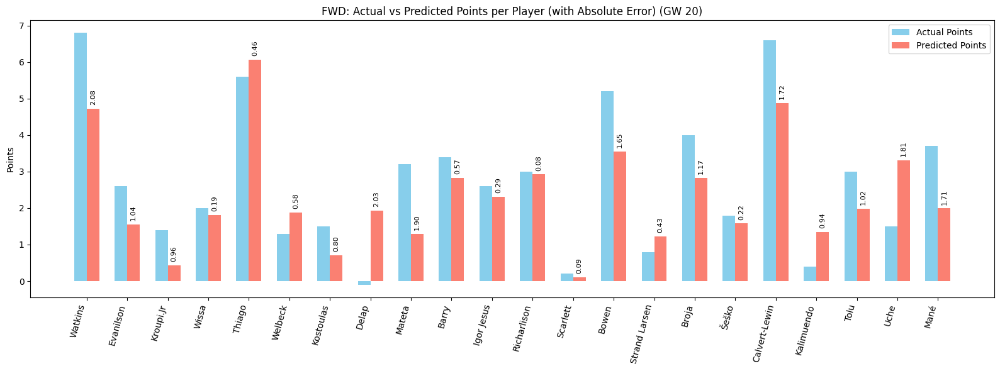

In [31]:
plot_preds(preds_df_20, 'FWD', 20)

### GW 21


Data prepared. X shape: (3840, 196), M shape: (3840, 7), Y shape: (3840, 2)

Starting Training...
Epoch 1/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.9802 - mae: 0.4682 - mse: 0.2504 - val_loss: 0.8942 - val_mae: 0.3964 - val_mse: 0.1835 - learning_rate: 1.0000e-04
Epoch 2/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.8500 - mae: 0.3395 - mse: 0.1456 - val_loss: 0.7816 - val_mae: 0.2773 - val_mse: 0.0961 - learning_rate: 1.0000e-04
Epoch 3/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.7517 - mae: 0.2291 - mse: 0.0727 - val_loss: 0.7088 - val_mae: 0.1950 - val_mse: 0.0501 - learning_rate: 1.0000e-04
Epoch 4/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.6926 - mae: 0.1643 - mse: 0.0409 - val_loss: 0.6624 - val_mae: 0.1532 - val_mse: 0.0322 - learning_rate: 1.0000e-04
Epoch 5/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6533 - mae: 0.1385 - mse: 0.0302 - val_loss: 0.6263 - val_mae: 0.1331 - val_mse: 0.0250 - learning_rate: 1.0000e-04
Epoch 6/100
44/4

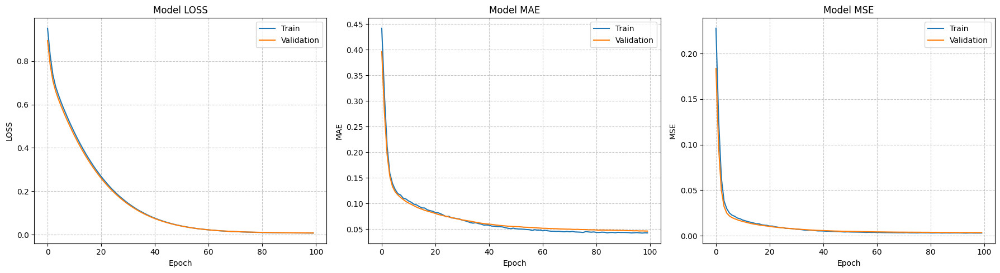


--- Final Test Set Evaluation (GW 22) ---
R²: 0.8297416561745876
MAE: 0.0416877269744873
MSE: 0.0027254940941930
Loss: 0.0069685815833509

--- Results for Gameweek 21 ---


,fpl_name,team,position,Actual_xP,Predicted_xP
221,Rice,Arsenal,MID,6.8,7.566415
1240,Thiago,Brentford,FWD,6.7,6.550513
453,Rogers,Aston Villa,MID,6.7,6.513760
3898,Reijnders,Man City,MID,5.8,5.819680
4433,Bruno G.,Newcastle,MID,6.0,5.625907
...,...,...,...,...,...
4153,Mount,Man Utd,MID,0.8,0.941018
1856,Foster,Burnley,FWD,0.2,0.931333
1293,De Cuyper,Brighton,DEF,1.0,0.904987
5632,Pedro Lima,Wolves,DEF,0.0,0.839829


In [ ]:
history_21, evaluation_metrics_21, preds_df_21 = apnn_trainer(active_data_, cols, 21)
# Plot History
plot_training_history(history_21)

# EVALUATE TEST SET PERFORMANCE
print(f"\n--- Final Test Set Evaluation (GW {gw}) ---")
print(f"R²: {evaluation_metrics_21['test_R2']:.16f}")
print(f"MAE: {evaluation_metrics_21['test_mae']:.16f}")
print(f"MSE: {evaluation_metrics_21['test_mse']:.16f}")
print(f"Loss: {evaluation_metrics_21['test_loss']:.16f}")


print("\n--- Results for Gameweek 21 ---")
preds_df_21.sort_values(by='Predicted_xP', ascending=False)#.#head(10).round(2).to_string(index=False))



#### Plots


###### GK


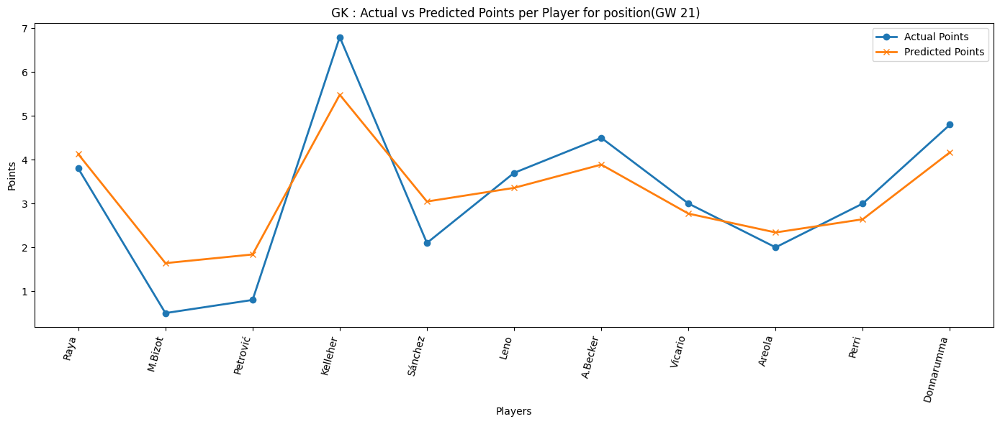

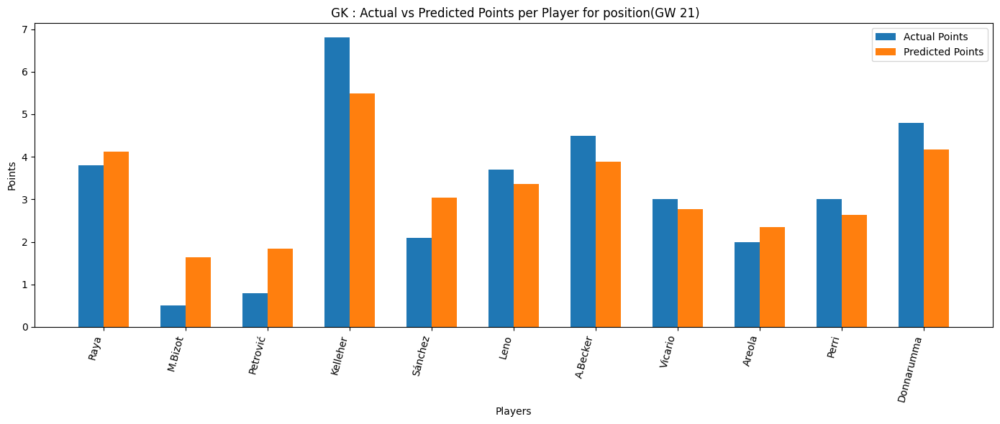

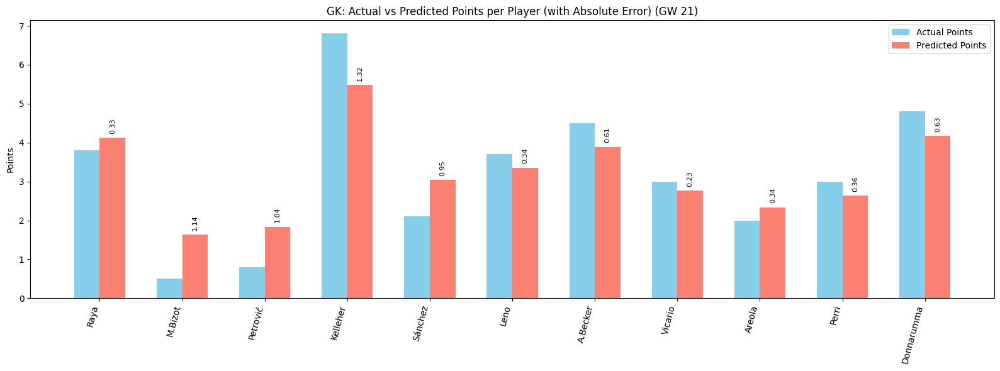

In [39]:
plot_preds(preds_df_21, 'GK', 21)


###### DEF


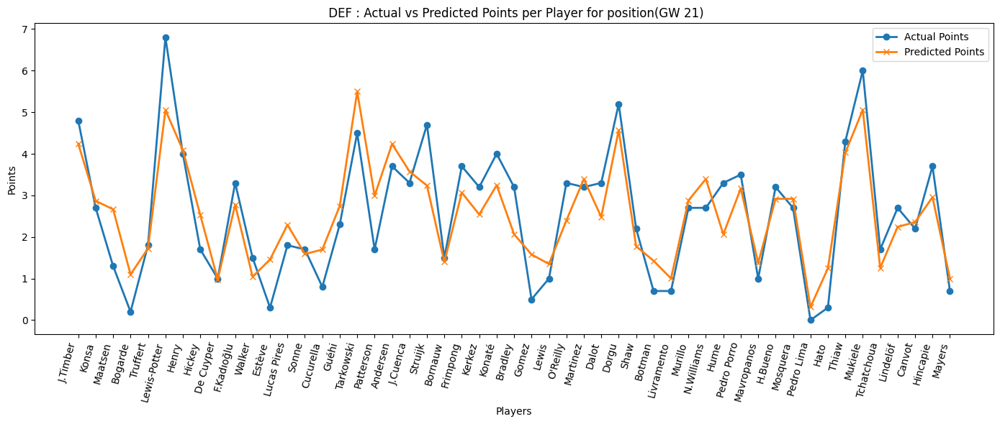

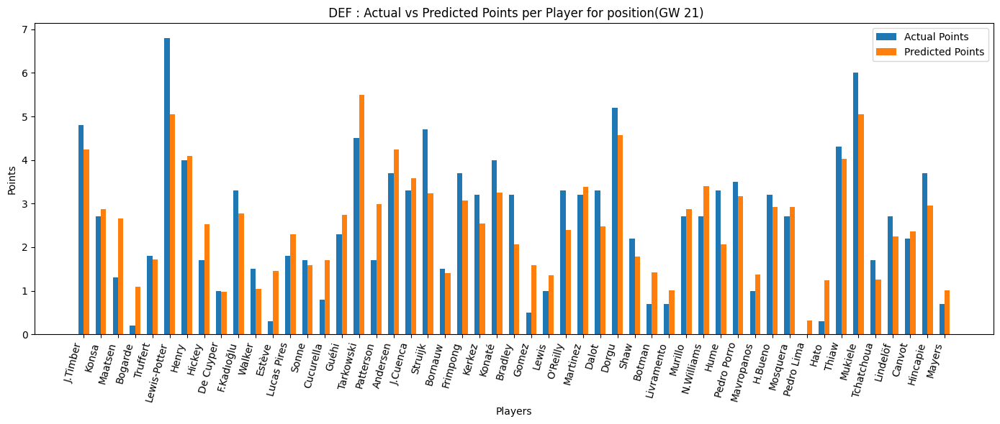

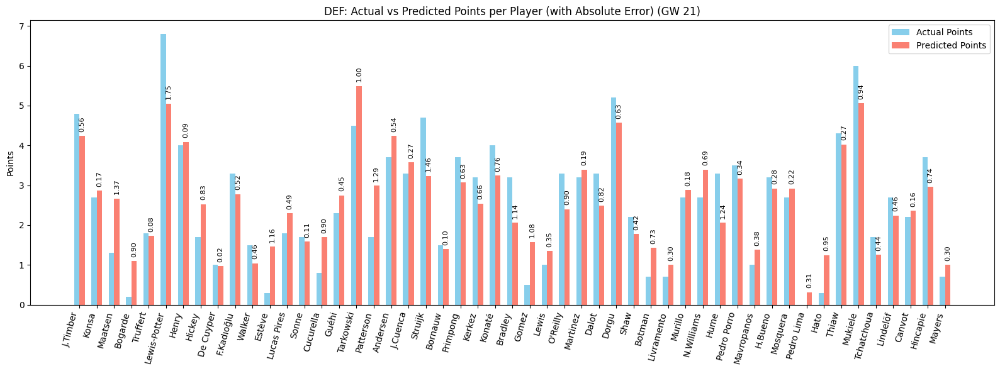

In [40]:
plot_preds(preds_df_21, 'DEF', 21)

###### MID


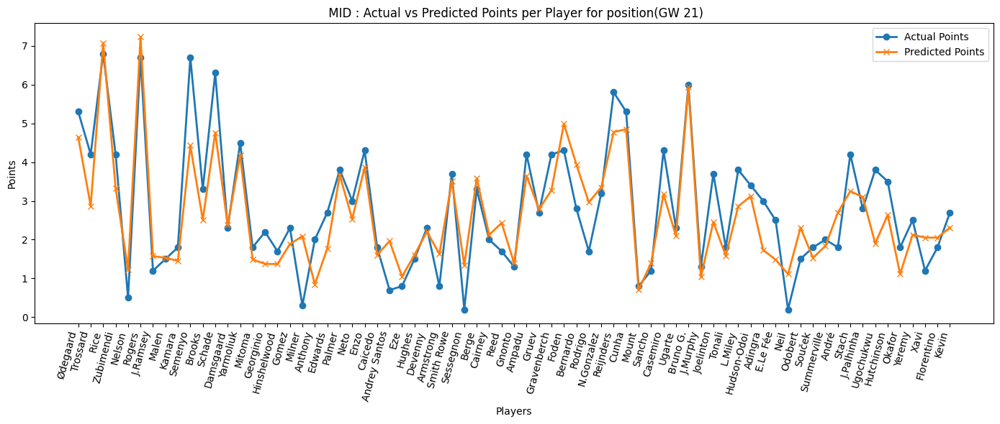

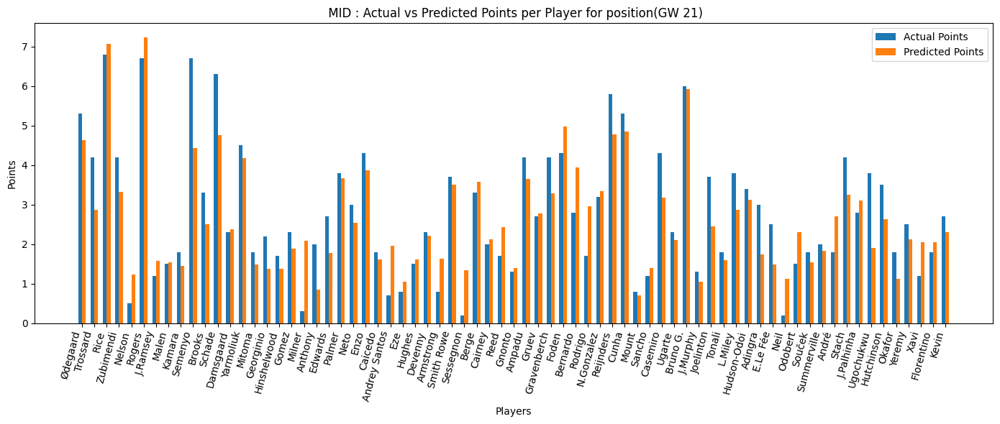

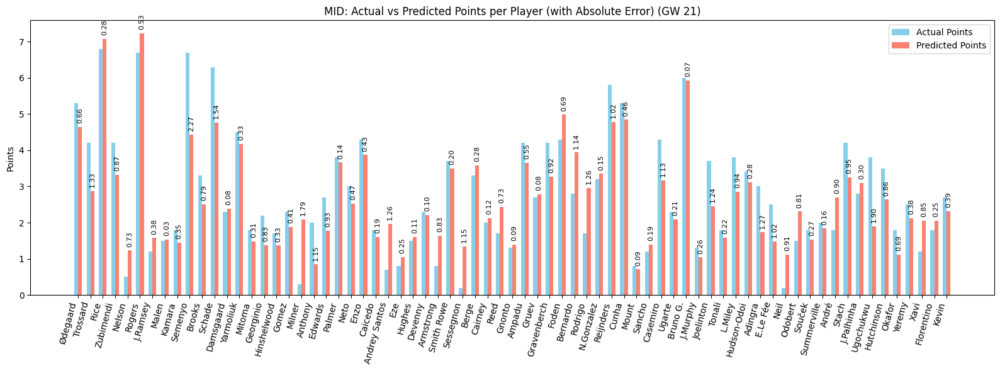

In [41]:
plot_preds(preds_df_21, 'MID', 21)

###### FWD


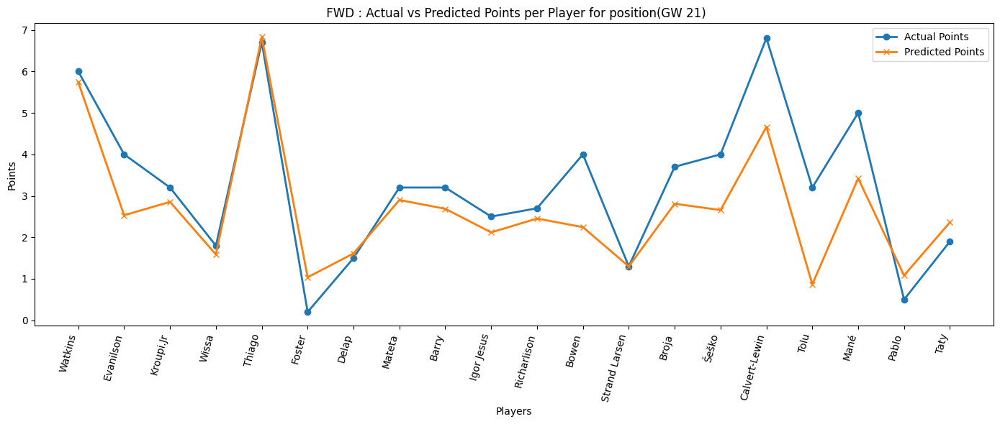

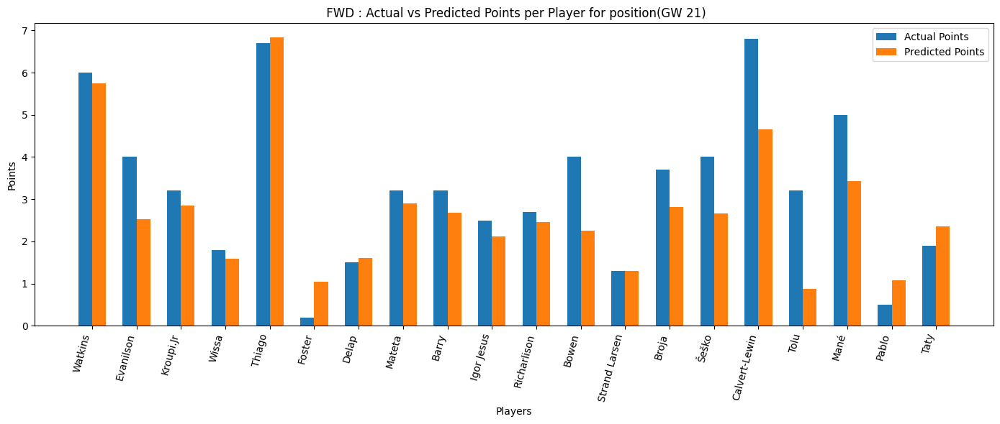

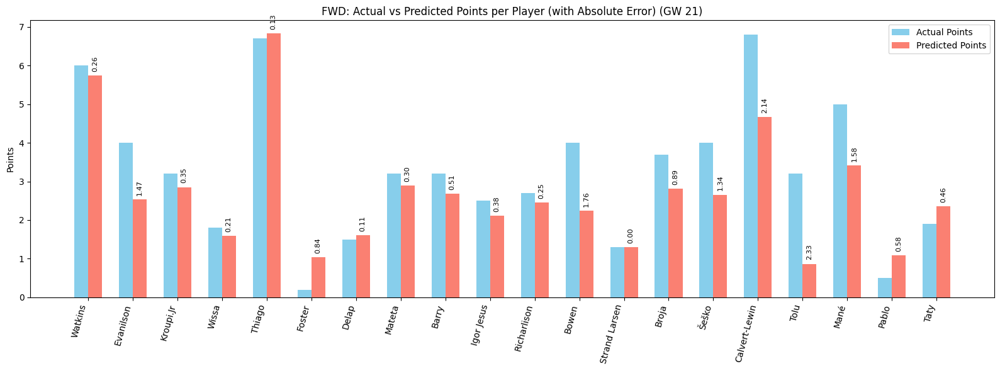

In [42]:
plot_preds(preds_df_21, 'FWD', 21)

## Results


In [45]:
pd.DataFrame([test_result_16, test_result_17, test_result_18, test_result_19, test_result_20, test_result_21])

,loss,mae,mse
0,1.093404,0.735469,0.853830
1,1.399417,0.832147,1.158033
2,1.321255,0.781865,1.080002
3,1.191872,0.760227,0.949821
4,1.385523,0.810979,1.145242
5,1.070699,0.708173,0.828885


## Current


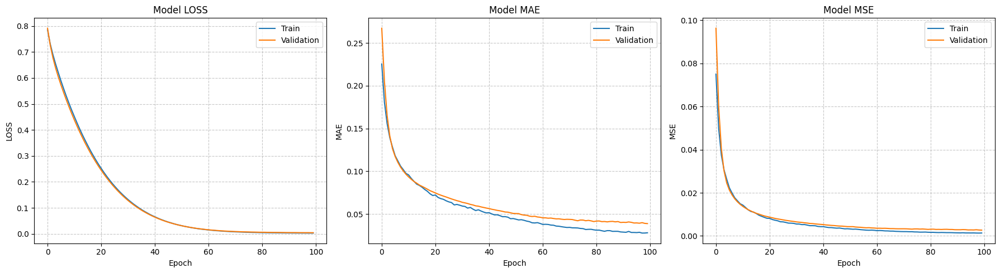


FINAL EVALUATION (Epoch 100)
Loss: 0.004198
MAE:  0.038925
MSE:  0.002693


--- Results for Gameweek 22 ---


,fpl_name,team,position,Actual_xP,Predicted_xP
3736,Foden,Man City,MID,0.0,9.223307
742,Semenyo,Man City,MID,0.0,9.158387
222,Rice,Arsenal,MID,0.0,8.703479
4434,Bruno G.,Newcastle,MID,0.0,8.383050
454,Rogers,Aston Villa,MID,0.0,8.382079
...,...,...,...,...,...
5633,Pedro Lima,Wolves,DEF,0.0,0.282786
4789,Awoniyi,Nott'm Forest,FWD,0.0,0.265804
3878,McAtee,Nott'm Forest,MID,0.0,0.248082
4219,Kone,Man Utd,MID,0.0,0.213368


In [33]:
# history_22, evaluation_metrics_22, preds_df_22 = apnn_trainer(active_data_, cols, 22)
# Plot History
plot_training_history(history_22)

# Extract evaluation metrics from the 'best' epoch
# Since restore_best_weights=True, the model's current weights match these metrics
best_epoch = np.argmin(history_22.history['val_loss'])

print("\n" + "="*30)
print(f"FINAL EVALUATION (Epoch {best_epoch + 1})")
print(f"Loss: {history_22.history['val_loss'][best_epoch]:.6f}")
print(f"MAE:  {history_22.history['val_mae'][best_epoch]:.6f}")
print(f"MSE:  {history_22.history['val_mse'][best_epoch]:.6f}")
print("="*30 + "\n")



print("\n--- Results for Gameweek 22 ---")
preds_df_22.sort_values(by='Predicted_xP', ascending=False)#.#head(10).round(2).to_string(index=False))



#### Plots


###### GK


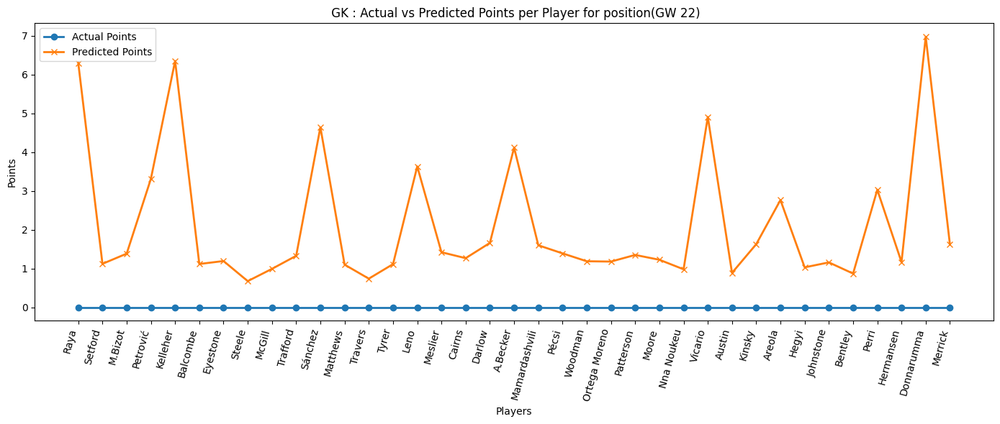

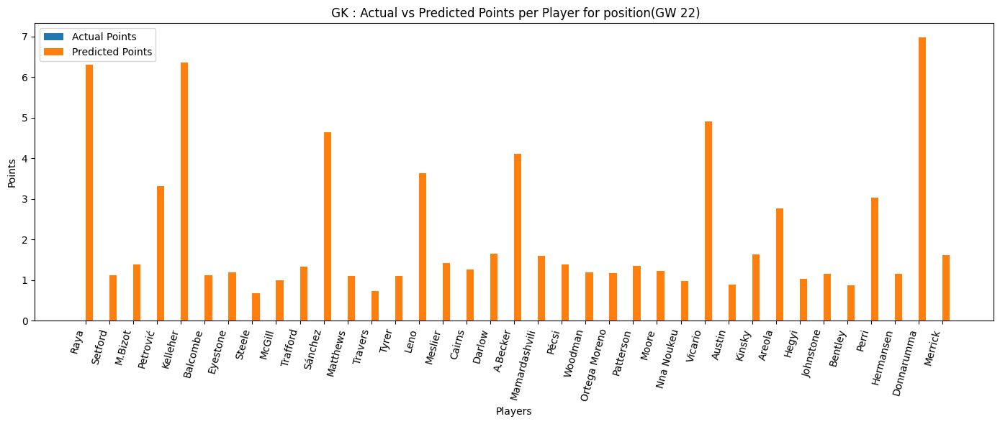

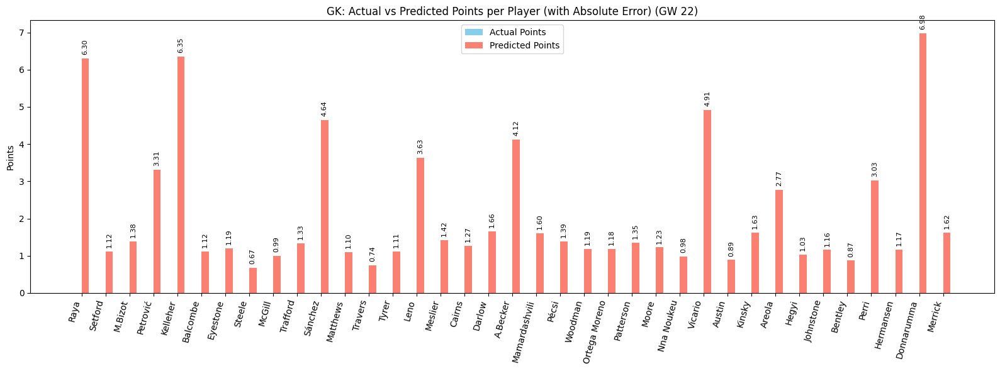

In [34]:
plot_preds(preds_df_22, 'GK', 22)


###### DEF


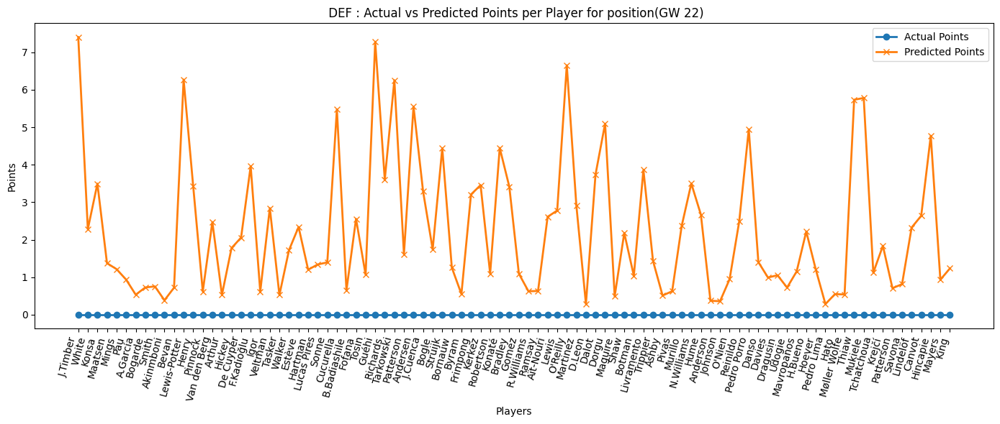

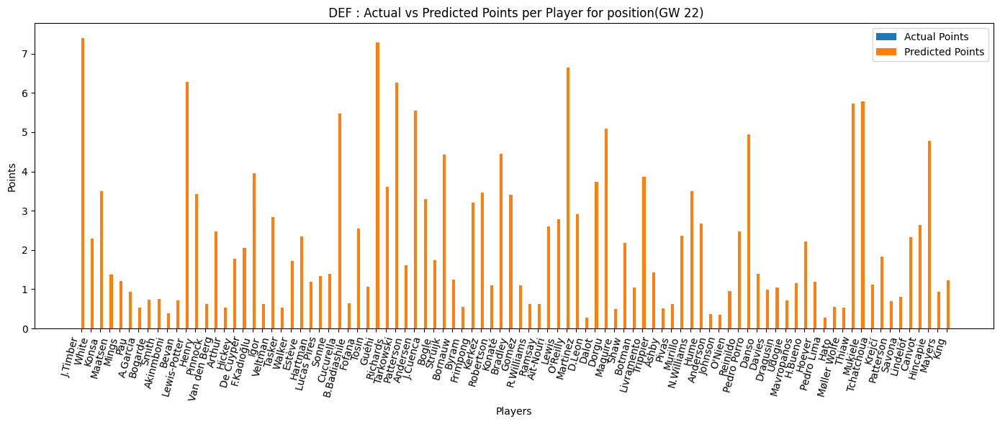

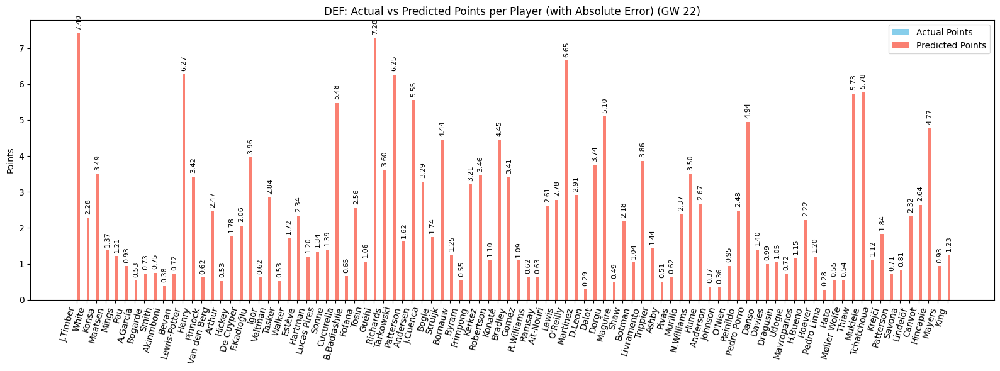

In [35]:
plot_preds(preds_df_22, 'DEF', 22)

###### MID


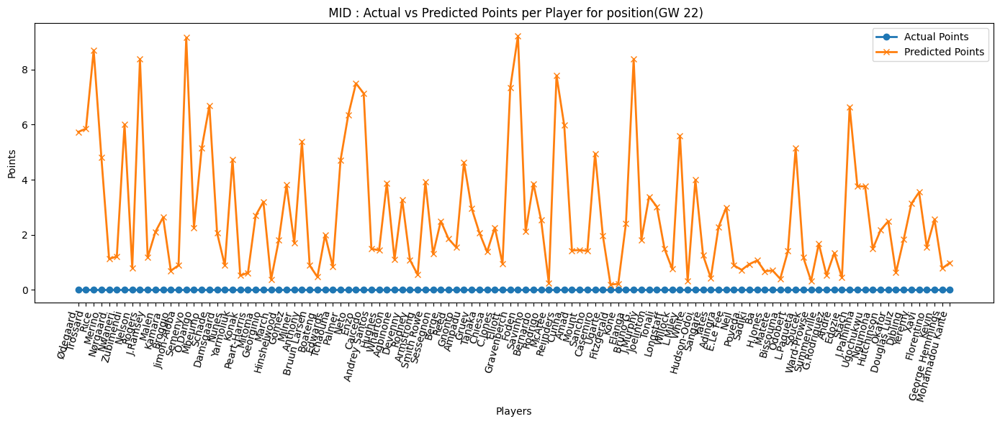

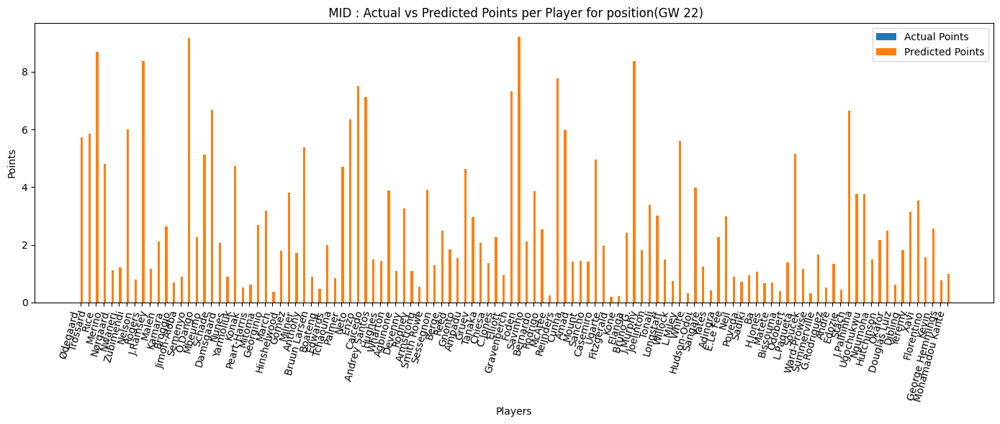

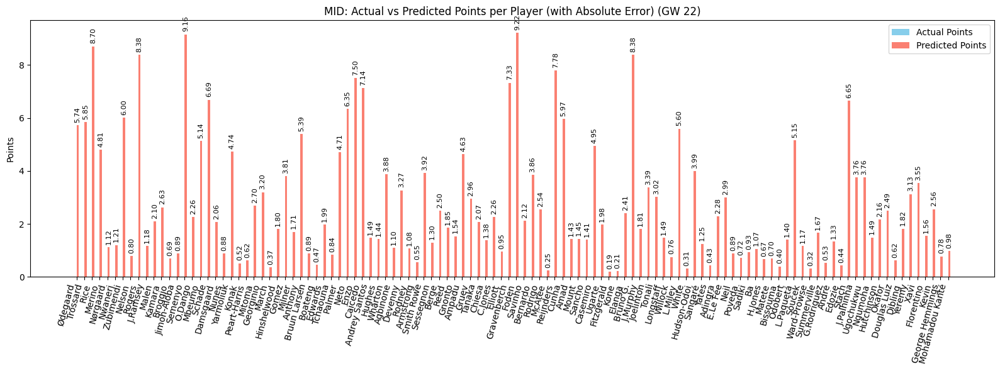

In [36]:
plot_preds(preds_df_22, 'MID', 22)

###### FWD


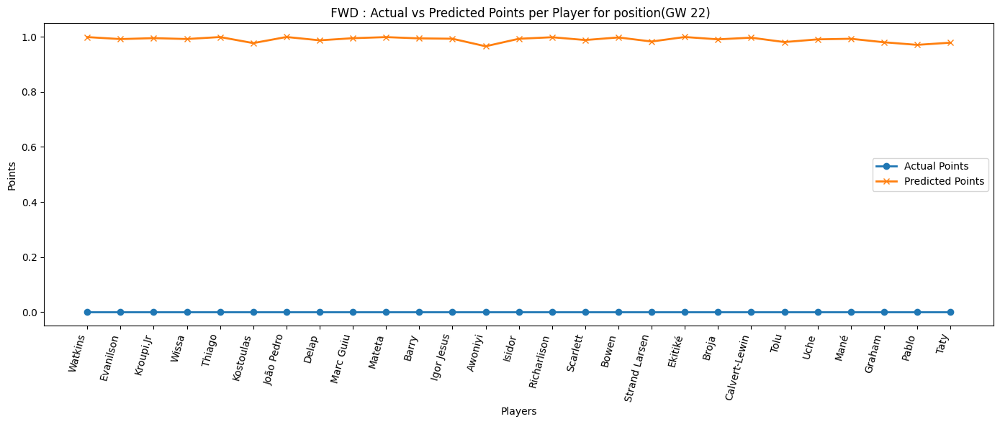

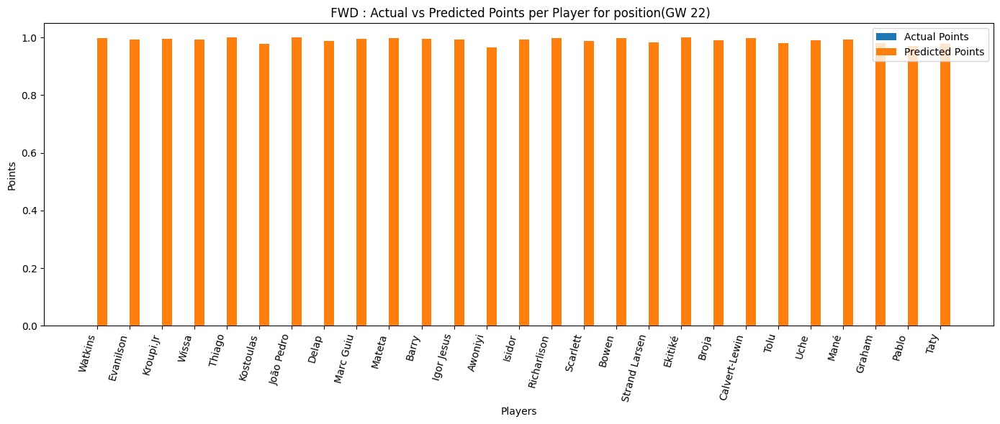

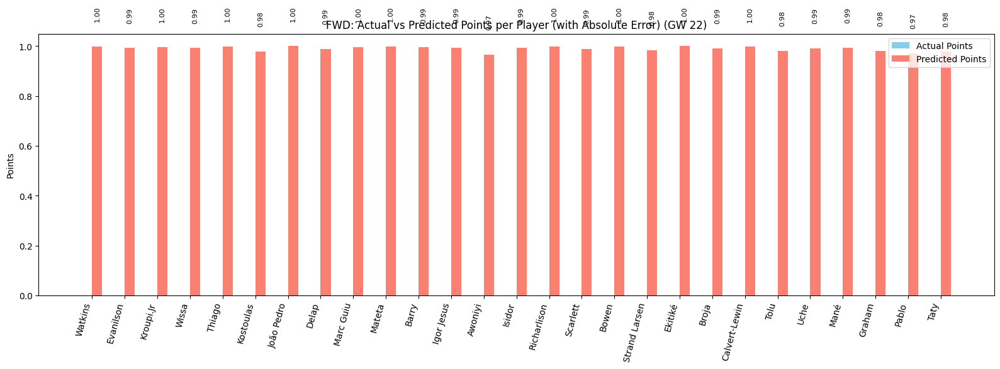

In [103]:
plot_preds(preds_df_22, 'FWD', 22)